# Identify hot and cold spots of high casualty risk rate or casualty location rate

In [55]:
import pandas as pd
import numpy as np
import matplotlib.pylab as plt
import geopandas as gpd 
import itertools



In [56]:
lsoa_space = gpd.read_file('data/London/LSOA_2011_London_gen_MHW.shp').to_crs('EPSG:4326')
lsoa_space.rename(columns={'LSOA11CD':'lsoa'}, inplace=True)

# 提取 lsoa_space GeoDataFrame 中的 'lsoa' 列并转换为列表
lsoa_list_from_gdf = lsoa_space['lsoa'].tolist()
# len(lsoa_list_from_gdf) #4835

# lsoa_space


In [57]:
collision_all = pd.read_csv('data/dft-road-casualty-statistics-collision-last-5-years.csv')

# 使用geopandas中的points_from_xy函数创建geometry列
collision_all['geometry'] = gpd.points_from_xy(collision_all['longitude'], collision_all['latitude'], crs="EPSG:4326")
# 将DataFrame转换为GeoDataFrame
collision_all = gpd.GeoDataFrame(collision_all, geometry='geometry', crs="EPSG:4326")
collision_all.rename(columns={'lsoa_of_accident_location':'lsoa'}, inplace=True)

collision_2021 = collision_all[collision_all['accident_year'] == 2021]
collision_2022 = collision_all[collision_all['accident_year'] == 2022]
collision_2023 = collision_all[collision_all['accident_year'] == 2023]

# 使用新的 lsoa_list 对 gdf_collision 进行过滤，并选择lsoa_of_accident_location和geometry列
collision_2021 = collision_2021[collision_2021['lsoa'].isin(lsoa_list_from_gdf)]
collision_2022 = collision_2022[collision_2022['lsoa'].isin(lsoa_list_from_gdf)]
collision_2023 = collision_2023[collision_2023['lsoa'].isin(lsoa_list_from_gdf)]

collision_2023
# collision_2023.plot(markersize=0.05)


C:\Users\YU\AppData\Local\Temp\ipykernel_1824\3929937235.py:1: DtypeWarning: Columns (0,2) have mixed types. Specify dtype option on import or set low_memory=False.
  collision_all = pd.read_csv('data/dft-road-casualty-statistics-collision-last-5-years.csv')


,accident_index,accident_year,accident_reference,location_easting_osgr,location_northing_osgr,longitude,latitude,police_force,accident_severity,number_of_vehicles,...,weather_conditions,road_surface_conditions,special_conditions_at_site,carriageway_hazards,urban_or_rural_area,did_police_officer_attend_scene_of_accident,trunk_road_flag,lsoa,enhanced_severity_collision,geometry
415826,2023010419171,2023,010419171,525060.0,170416.0,-0.202878,51.418974,1,3,1,...,8,2,0,0,1,1,2,E01003383,-1,POINT (-0.20288 51.41897)
415827,2023010419183,2023,010419183,535463.0,198745.0,-0.042464,51.671155,1,3,3,...,1,1,0,0,1,1,2,E01001547,-1,POINT (-0.04246 51.67116)
415828,2023010419189,2023,010419189,508702.0,177696.0,-0.435789,51.487777,1,3,2,...,1,1,0,0,1,1,2,E01002448,-1,POINT (-0.43579 51.48778)
415829,2023010419191,2023,010419191,520341.0,190175.0,-0.263972,51.597575,1,3,2,...,9,1,0,0,1,1,2,E01000129,-1,POINT (-0.26397 51.59758)
415830,2023010419192,2023,010419192,527255.0,176963.0,-0.168976,51.477324,1,3,2,...,1,1,0,0,1,1,2,E01004583,-1,POINT (-0.16898 51.47732)
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
503689,2023481407567,2023,481407567,531350.0,181567.0,-0.108331,51.517763,48,2,1,...,8,2,0,0,1,3,2,E01000917,5,POINT (-0.10833 51.51776)
503690,2023481409647,2023,481409647,531556.0,181647.0,-0.105334,51.518434,48,2,1,...,1,1,0,0,1,1,2,E01032740,7,POINT (-0.10533 51.51843)
503691,2023481409652,2023,481409652,533386.0,181660.0,-0.078970,51.518122,48,3,1,...,2,2,0,0,1,1,2,E01032739,3,POINT (-0.07897 51.51812)
503692,2023481409658,2023,481409658,531594.0,181423.0,-0.104870,51.516412,48,3,2,...,1,1,0,0,1,3,2,E01032740,3,POINT (-0.10487 51.51641)


C:\Users\YU\AppData\Local\Temp\ipykernel_1824\3658465993.py:23: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout()


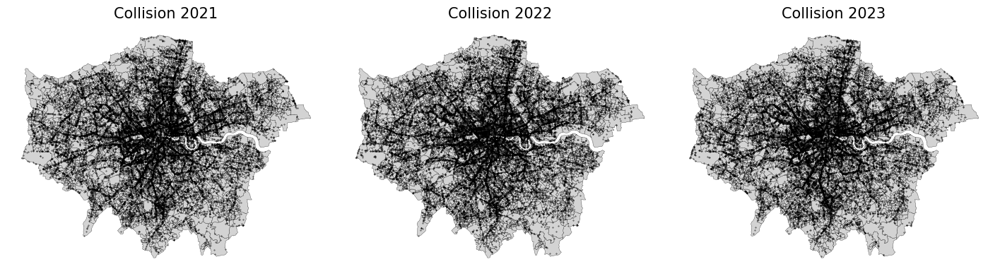

In [58]:
# 创建并列子图
fig, axes = plt.subplots(1, 3, figsize=(18, 6), gridspec_kw={'wspace': 0.05})  # 减小子图之间的间距

# 设置标题列表
titles = ['Collision 2021', 'Collision 2022', 'Collision 2023']
collision_data = [collision_2021, collision_2022, collision_2023]

# 绘制每一年的事故数据
for i, ax in enumerate(axes):
    # 绘制 lsoa_space 边界图
    lsoa_space.plot(ax=ax, color='lightgray', edgecolor='black', linewidth=0.2)

    # 绘制对应年份的事故点数据
    collision_data[i].plot(ax=ax, color='black', markersize=0.1)

    # 设置标题
    ax.set_title(titles[i], fontsize=15)

    # 隐藏坐标轴（包括边框）
    ax.axis('off')

# 调整布局
plt.tight_layout()
plt.show()


In [59]:
lsoa_space

,lsoa,LSOA11NM,MSOA11CD,MSOA11NM,LAD11CD,LAD11NM,RGN11CD,RGN11NM,USUALRES,HHOLDRES,COMESTRES,POPDEN,HHOLDS,AVHHOLDSZ,geometry
0,E01000001,City of London 001A,E02000001,City of London 001,E09000001,City of London,E12000007,London,1465,1465,0,112.9,876,1.7,"POLYGON ((-0.09729 51.52158, -0.09652 51.52027..."
1,E01000002,City of London 001B,E02000001,City of London 001,E09000001,City of London,E12000007,London,1436,1436,0,62.9,830,1.7,"POLYGON ((-0.08813 51.51941, -0.08929 51.51752..."
2,E01000003,City of London 001C,E02000001,City of London 001,E09000001,City of London,E12000007,London,1346,1250,96,227.7,817,1.5,"POLYGON ((-0.09679 51.52325, -0.09647 51.52282..."
3,E01000005,City of London 001E,E02000001,City of London 001,E09000001,City of London,E12000007,London,985,985,0,52.0,467,2.1,"POLYGON ((-0.07323 51.51, -0.07553 51.50974, -..."
4,E01000006,Barking and Dagenham 016A,E02000017,Barking and Dagenham 016,E09000002,Barking and Dagenham,E12000007,London,1703,1699,4,116.2,543,3.1,"POLYGON ((0.09115 51.53909, 0.09326 51.53787, ..."
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
4830,E01033742,Greenwich 007F,E02000319,Greenwich 007,E09000011,Greenwich,E12000007,London,1352,1352,0,107.6,581,2.3,"POLYGON ((0.0824 51.49886, 0.08415 51.49803, 0..."
4831,E01033743,Greenwich 002H,E02000314,Greenwich 002,E09000011,Greenwich,E12000007,London,2038,2038,0,20.4,663,3.1,"POLYGON ((0.11081 51.5098, 0.11227 51.50782, 0..."
4832,E01033744,Greenwich 007G,E02000319,Greenwich 007,E09000011,Greenwich,E12000007,London,1845,1728,117,125.8,646,2.7,"POLYGON ((0.08072 51.4955, 0.08165 51.49491, 0..."
4833,E01033745,Greenwich 002I,E02000314,Greenwich 002,E09000011,Greenwich,E12000007,London,1820,1820,0,32.3,591,3.1,"POLYGON ((0.10806 51.50135, 0.10664 51.50021, ..."


In [60]:
# Calculate area in square kilometers
lsoa_space = lsoa_space.to_crs(epsg=27700)  # 转换为英国投影坐标系
lsoa_space['area_km2'] = lsoa_space['geometry'].area / 1e6  # 转换为平方千米
lsoa_space = lsoa_space.to_crs(epsg=4326)  # 转回 WGS84

collision_data = [collision_2021, collision_2022, collision_2023]

# Loop through each year's data to calculate counts and densities
collision_densities = []  # To store density values for legend range calculation

for i, year_data in enumerate(collision_data):
    # Spatial join to match collisions to LSOA regions
    joined = gpd.sjoin(year_data, lsoa_space, how='left', predicate='within')

    # Calculate collision count for each LSOA
    collision_count = joined.groupby('lsoa_right').size()
    lsoa_space[f'collision_count_{i}'] = lsoa_space['lsoa'].map(collision_count).fillna(0)

    # Calculate collision density (count per km²)
    lsoa_space[f'collision_density_{i}'] = lsoa_space[f'collision_count_{i}'] / lsoa_space['area_km2']
    
    # Collect all densities for global legend range
    collision_densities.extend(lsoa_space[f'collision_density_{i}'])


In [61]:
collision_count.sum()
lsoa_space['collision_count_1'].sum() # very small part of points missing

23468.0

C:\Users\YU\AppData\Local\Temp\ipykernel_1824\4177539209.py:12: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.
  cmap = cm.get_cmap('RdBu', num_bins).reversed()  # 反转 colormap
C:\Users\YU\AppData\Local\Temp\ipykernel_1824\4177539209.py:42: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout()


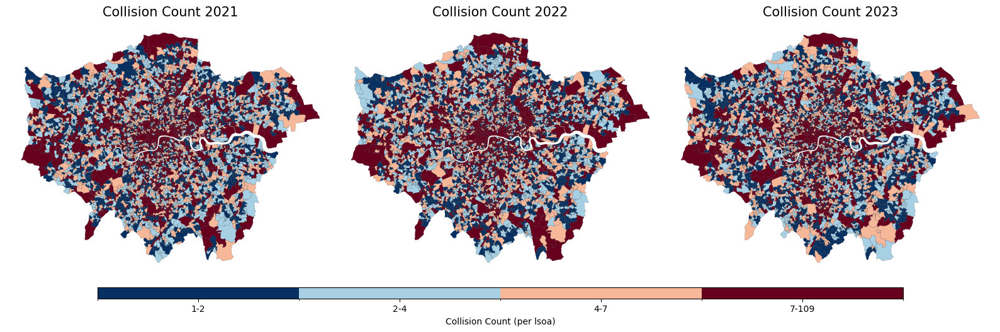

In [62]:
import matplotlib.pyplot as plt
import matplotlib.cm as cm
import matplotlib.colors as mcolors
import numpy as np

# 计算分段边界（将数据划分为6个区间）
num_bins = 4
breaks = np.percentile(collision_count, np.linspace(0, 100, num_bins + 1))  # 6个分段边界

# 创建颜色映射对象
norm = mcolors.BoundaryNorm(breaks, ncolors=num_bins, clip=True)
cmap = cm.get_cmap('RdBu', num_bins).reversed()  # 反转 colormap

# 创建第一个图形：事故数量
fig1, axes1 = plt.subplots(1, 3, figsize=(16, 6))  # 1行3列

# 设置标题列表
titles = ['Collision Count 2021', 'Collision Count 2022', 'Collision Count 2023']

# 绘制每一年的事故数量图
for i, ax in enumerate(axes1):
    lsoa_space.plot(
        column=f'collision_count_{i}', ax=ax, cmap=cmap,
        edgecolor='black', linewidth=0.1, legend=False,
        norm=norm  # 使用分段颜色映射
    )
    ax.set_title(titles[i], fontsize=15)
    ax.axis('off')  # 隐藏坐标轴

# 添加事故数量图例
cbar_ax1 = fig1.add_axes([0.1, 0.1, 0.8, 0.03])
sm_count = cm.ScalarMappable(cmap=cmap, norm=norm)
cbar1 = fig1.colorbar(sm_count, cax=cbar_ax1, orientation='horizontal', boundaries=breaks)
cbar1.set_label('Collision Count (per lsoa)')

# 设置 colorbar 的刻度和标签
tick_labels = [f'{int(breaks[i])}-{int(breaks[i+1])}' for i in range(num_bins)]
cbar1.set_ticks(breaks[:-1] + np.diff(breaks) / 2)  # 在每个分段的中间放置刻度
cbar1.set_ticklabels(tick_labels)  # 设置分段标签

# 调整布局并显示
plt.tight_layout()
plt.subplots_adjust(wspace=0.005)
plt.show()



C:\Users\YU\AppData\Local\Temp\ipykernel_1824\4012818450.py:42: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.
  cmap = cm.get_cmap('RdBu', num_bins).reversed()  # 反转 colormap
C:\Users\YU\AppData\Local\Temp\ipykernel_1824\4012818450.py:72: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout()


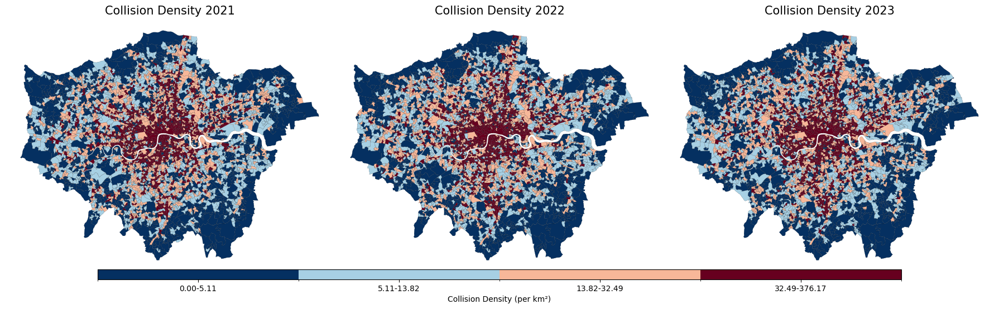

In [63]:
# # Determine global min and max for density color mapping
# vmin_density, vmax_density = np.min(collision_densities), np.max(collision_densities)

# # 创建第二个图形：事故密度
# fig2, axes2 = plt.subplots(1, 3, figsize=(16, 6))  # 1行3列

# # 设置标题列表
# titles = ['Collision Density 2021', 'Collision Density 2022', 'Collision Density 2023']

# # 绘制每一年的事故密度图
# for i, ax in enumerate(axes2):
#     lsoa_space.plot(
#         column=f'collision_density_{i}', ax=ax, cmap='OrRd',
#         vmin=vmin_density, vmax=vmax_density, edgecolor='none', legend=False
#     ) 
#     ax.set_title(titles[i], fontsize=15)
#     ax.axis('off')  # 隐藏坐标轴

# # 添加事故密度图例
# cbar_ax2 = fig2.add_axes([0.2, 0.1, 0.6, 0.03])
# sm_density = cm.ScalarMappable(cmap='OrRd', norm=plt.Normalize(vmin=vmin_density, vmax=vmax_density))
# cbar2 = fig2.colorbar(sm_density, cax=cbar_ax2, orientation='horizontal')
# cbar2.set_label('Collision Density (per km²)')

# # 调整布局并显示
# plt.tight_layout()
# plt.subplots_adjust(wspace=0.005)
# plt.show()

import matplotlib.pyplot as plt
import matplotlib.cm as cm
import matplotlib.colors as mcolors
import numpy as np

# 计算分段边界（将数据划分为4个区间）
num_bins = 4
breaks = np.percentile(collision_densities, np.linspace(0, 100, num_bins + 1))  # 4个分段边界

# 创建颜色映射对象
norm = mcolors.BoundaryNorm(breaks, ncolors=num_bins, clip=True)
# cmap = cm.get_cmap('OrRd', num_bins)  # 使用蓝色到红色的渐变色
cmap = cm.get_cmap('RdBu', num_bins).reversed()  # 反转 colormap

# 创建第二个图形：事故密度
fig2, axes2 = plt.subplots(1, 3, figsize=(18, 6))  # 1行3列

# 设置标题列表
titles = ['Collision Density 2021', 'Collision Density 2022', 'Collision Density 2023']

# 绘制每一年的事故密度图
for i, ax in enumerate(axes2):
    lsoa_space.plot(
        column=f'collision_density_{i}', ax=ax, cmap=cmap,
        edgecolor='black', linewidth=0.1, legend=False,
        norm=norm  # 使用分段颜色映射
    )
    ax.set_title(titles[i], fontsize=15)
    ax.axis('off')  # 隐藏坐标轴

# 添加事故密度图例
cbar_ax2 = fig2.add_axes([0.1, 0.1, 0.8, 0.03])  # 位置设置
sm_density = cm.ScalarMappable(cmap=cmap, norm=norm)
cbar2 = fig2.colorbar(sm_density, cax=cbar_ax2, orientation='horizontal', boundaries=breaks)
cbar2.set_label('Collision Density (per km²)')

# 设置 colorbar 的刻度和标签
tick_labels = [f'{breaks[i]:.2f}-{breaks[i+1]:.2f}' for i in range(num_bins)]
cbar2.set_ticks(breaks[:-1] + np.diff(breaks) / 2)  # 在每个分段的中间放置刻度
cbar2.set_ticklabels(tick_labels)  # 设置分段标签

# 调整布局并显示
plt.tight_layout()
plt.subplots_adjust(wspace=0.005)
plt.show()


In [64]:
lsoa_space

,lsoa,LSOA11NM,MSOA11CD,MSOA11NM,LAD11CD,LAD11NM,RGN11CD,RGN11NM,USUALRES,HHOLDRES,...,HHOLDS,AVHHOLDSZ,geometry,area_km2,collision_count_0,collision_density_0,collision_count_1,collision_density_1,collision_count_2,collision_density_2
0,E01000001,City of London 001A,E02000001,City of London 001,E09000001,City of London,E12000007,London,1465,1465,...,876,1.7,"POLYGON ((-0.09729 51.52158, -0.09652 51.52027...",0.133321,4.0,30.002827,2.0,15.001414,7.0,52.504948
1,E01000002,City of London 001B,E02000001,City of London 001,E09000001,City of London,E12000007,London,1436,1436,...,830,1.7,"POLYGON ((-0.08813 51.51941, -0.08929 51.51752...",0.226191,4.0,17.684148,9.0,39.789333,2.0,8.842074
2,E01000003,City of London 001C,E02000001,City of London 001,E09000001,City of London,E12000007,London,1346,1250,...,817,1.5,"POLYGON ((-0.09679 51.52325, -0.09647 51.52282...",0.057303,0.0,0.000000,0.0,0.000000,0.0,0.000000
3,E01000005,City of London 001E,E02000001,City of London 001,E09000001,City of London,E12000007,London,985,985,...,467,2.1,"POLYGON ((-0.07323 51.51, -0.07553 51.50974, -...",0.190739,19.0,99.612685,15.0,78.641593,19.0,99.612685
4,E01000006,Barking and Dagenham 016A,E02000017,Barking and Dagenham 016,E09000002,Barking and Dagenham,E12000007,London,1703,1699,...,543,3.1,"POLYGON ((0.09115 51.53909, 0.09326 51.53787, ...",0.144196,0.0,0.000000,1.0,6.935012,1.0,6.935012
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
4830,E01033742,Greenwich 007F,E02000319,Greenwich 007,E09000011,Greenwich,E12000007,London,1352,1352,...,581,2.3,"POLYGON ((0.0824 51.49886, 0.08415 51.49803, 0...",0.123309,0.0,0.000000,0.0,0.000000,0.0,0.000000
4831,E01033743,Greenwich 002H,E02000314,Greenwich 002,E09000011,Greenwich,E12000007,London,2038,2038,...,663,3.1,"POLYGON ((0.11081 51.5098, 0.11227 51.50782, 0...",1.004853,0.0,0.000000,4.0,3.980681,0.0,0.000000
4832,E01033744,Greenwich 007G,E02000319,Greenwich 007,E09000011,Greenwich,E12000007,London,1845,1728,...,646,2.7,"POLYGON ((0.08072 51.4955, 0.08165 51.49491, 0...",0.152262,2.0,13.135254,0.0,0.000000,1.0,6.567627
4833,E01033745,Greenwich 002I,E02000314,Greenwich 002,E09000011,Greenwich,E12000007,London,1820,1820,...,591,3.1,"POLYGON ((0.10806 51.50135, 0.10664 51.50021, ...",0.558478,6.0,10.743491,14.0,25.068145,2.0,3.581164


In [65]:
count2021 = collision_2021['lsoa'].value_counts()
count2022 = collision_2022['lsoa'].value_counts()
count2023 = collision_2023['lsoa'].value_counts()
count2023

unique_selected_2021 = collision_2021[['lsoa']].drop_duplicates(subset='lsoa')
unique_selected_2021['count'] = unique_selected_2021['lsoa'].map(count2021)
unique_selected_2021

unique_selected_2022 = collision_2022[['lsoa']].drop_duplicates(subset='lsoa')
unique_selected_2022['count'] = unique_selected_2022['lsoa'].map(count2022)
unique_selected_2022

unique_selected_2023 = collision_2023[['lsoa']].drop_duplicates(subset='lsoa')
unique_selected_2023['count'] = unique_selected_2023['lsoa'].map(count2023)

unique_selected_2022# 4263 rows × 2 columns
# unique_selected_2023['count'].sum() # 一个不落


,lsoa,count
309822,E01001883,13
309823,E01033745,16
309824,E01000378,16
309825,E01001529,7
309826,E01003673,3
...,...,...
399296,E01032740,41
399297,E01000005,11
399302,E01032739,110
399315,E01000002,8


In [66]:
information = pd.read_csv("data/lsoa-reference-data.csv")
information = information[information['Census Year'] == 2021]
information = information.rename(columns={'LSOA Code': 'lsoa'})
information

,Census Year,lsoa,Road Length,Population,IMD Decile
4835,2021,E01000001,2855.474246,1475,9
4836,2021,E01000002,4288.325821,1384,10
4837,2021,E01000003,1073.346027,1616,5
4838,2021,E01000005,4528.304022,1103,3
4839,2021,E01000006,2703.273461,1845,5
...,...,...,...,...,...
9824,2021,E01035718,17495.817160,2568,8
9825,2021,E01035719,1919.390834,1272,6
9826,2021,E01035720,2317.296223,1217,6
9827,2021,E01035721,5156.255294,2328,4


In [67]:
# 创建一个字典来存储每年的结果
results = {}

# 定义年份和对应的 unique_selected 数据
years = [2021, 2022, 2023]
unique_selected_data = [unique_selected_2021, unique_selected_2022, unique_selected_2023]

# 循环遍历每一年
for i, year in enumerate(years):
    # 合并数据
    res = pd.merge(lsoa_space[['lsoa', 'geometry']], unique_selected_data[i], on='lsoa', how='left')
    res = pd.merge(res, information, on='lsoa', how='left')
    res = res.rename(columns={'count':'count_collision'})

    # 计算指标
    res['casualty_length_rate'] = res['count_collision'] / res['Road Length'] * 1000
    
    # 填充缺失值
    # res['casualty_length_rate'] = res['casualty_length_rate'].fillna(0)

    median_length = res['Road Length'].median()
    res.loc[res['Road Length'].isna(), 'casualty_length_rate'] = (
        res.loc[res['Road Length'].isna(), 'count_collision'] / median_length * 1000)

    res.loc[res['count_collision'].isna(), 'casualty_length_rate'] = 0
    
    res = gpd.GeoDataFrame(res, geometry='geometry')

    # 将结果存储在字典中
    results[year] = res

# 访问每年的数据，例如：
res2021 = results[2021]
res2022 = results[2022]
res2023 = results[2023]

res2022

,lsoa,geometry,count_collision,Census Year,Road Length,Population,IMD Decile,casualty_length_rate
0,E01000001,"POLYGON ((-0.09729 51.52158, -0.09652 51.52027...",2.0,2021.0,2855.474246,1475.0,9.0,0.700409
1,E01000002,"POLYGON ((-0.08813 51.51941, -0.08929 51.51752...",8.0,2021.0,4288.325821,1384.0,10.0,1.865530
2,E01000003,"POLYGON ((-0.09679 51.52325, -0.09647 51.52282...",NaN,2021.0,1073.346027,1616.0,5.0,0.000000
3,E01000005,"POLYGON ((-0.07323 51.51, -0.07553 51.50974, -...",11.0,2021.0,4528.304022,1103.0,3.0,2.429166
4,E01000006,"POLYGON ((0.09115 51.53909, 0.09326 51.53787, ...",1.0,2021.0,2703.273461,1845.0,5.0,0.369922
...,...,...,...,...,...,...,...,...
4830,E01033742,"POLYGON ((0.0824 51.49886, 0.08415 51.49803, 0...",NaN,2021.0,840.206733,1339.0,7.0,0.000000
4831,E01033743,"POLYGON ((0.11081 51.5098, 0.11227 51.50782, 0...",2.0,2021.0,5520.035242,1941.0,5.0,0.362317
4832,E01033744,"POLYGON ((0.08072 51.4955, 0.08165 51.49491, 0...",1.0,2021.0,3063.978880,1803.0,3.0,0.326373
4833,E01033745,"POLYGON ((0.10806 51.50135, 0.10664 51.50021, ...",16.0,2021.0,9274.556671,1783.0,4.0,1.725150


<Axes: >

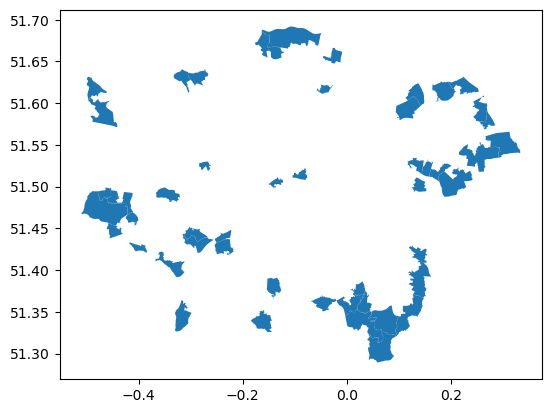

In [68]:
res2023.sort_values(by='Road Length', ascending=False).head(50).plot()

## Casualty rate (per 1000 persons)

In [69]:
casualty_all = pd.read_csv("data/dft-road-casualty-statistics-casualty-last-5-years.csv")

casualty_all = casualty_all[casualty_all['lsoa_of_casualty'].isin(lsoa_list_from_gdf)]

casualty_all = casualty_all[['accident_year','lsoa_of_casualty']].rename(columns={'lsoa_of_casualty': 'lsoa'})
# 按 'lsoa' 和 'accident_year' 分组并统计事故数量
summed_counts = casualty_all.groupby(['lsoa', 'accident_year']).size().reset_index()
# Rename columns for clarity (optional)
summed_counts.columns = ['lsoa', 'year','count_casualty']

cas2021 = summed_counts[summed_counts['year'] == 2021]
cas2022 = summed_counts[summed_counts['year'] == 2022]
cas2023 = summed_counts[summed_counts['year'] == 2023]

cas2023

C:\Users\YU\AppData\Local\Temp\ipykernel_1824\2666592960.py:1: DtypeWarning: Columns (0,2) have mixed types. Specify dtype option on import or set low_memory=False.
  casualty_all = pd.read_csv("data/dft-road-casualty-statistics-casualty-last-5-years.csv")


,lsoa,year,count_casualty
1,E01000001,2023,1
8,E01000003,2023,4
12,E01000005,2023,2
17,E01000006,2023,6
22,E01000007,2023,4
...,...,...,...
23430,E01033740,2023,3
23435,E01033741,2023,10
23440,E01033742,2023,5
23448,E01033744,2023,3


In [70]:
# 创建一个字典来存储每年的结果
results = {}

# 定义年份和对应的 unique_selected 数据
years = [2021, 2022, 2023]
data = [cas2021, cas2022, cas2023]
data2 = [res2021, res2022, res2023]

# 循环遍历每一年
for i, year in enumerate(years):
    # 合并数据
    res = pd.merge(lsoa_space[['lsoa', 'geometry']], data[i], on='lsoa', how='left')
    res = pd.merge(res, information, on='lsoa', how='left')
    
    # 计算指标
    res['casualty_people_rate'] = res['count_casualty'] / res['Population'] * 1000
    # # 填充缺失值
    # res['casualty_people_rate'] = res['casualty_people_rate'].fillna(0)

        # res.loc[res['Population'].isna(), 'casualty_people_rate'] = res['count_casualty'] / res['Population'].median() * 1000
        
    # 仅对 Population 为 NaN 的行计算并赋值
    median_population = res['Population'].median()
    res.loc[res['Population'].isna(), 'casualty_people_rate'] = (
        res.loc[res['Population'].isna(), 'count_casualty'] / median_population * 1000)

    res.loc[res['count_casualty'].isna(), 'casualty_people_rate'] = 0

    res = pd.merge(res, data2[i][['count_collision', 'casualty_length_rate','lsoa']], on='lsoa', how='left')

    res = gpd.GeoDataFrame(res, geometry='geometry')

    # 将结果存储在字典中
    results[year] = res

# 访问每年的数据，例如：
res2021 = results[2021]
res2022 = results[2022]
res2023 = results[2023]



In [71]:
res2023

,lsoa,geometry,year,count_casualty,Census Year,Road Length,Population,IMD Decile,casualty_people_rate,count_collision,casualty_length_rate
0,E01000001,"POLYGON ((-0.09729 51.52158, -0.09652 51.52027...",2023.0,1.0,2021.0,2855.474246,1475.0,9.0,0.677966,7.0,2.451432
1,E01000002,"POLYGON ((-0.08813 51.51941, -0.08929 51.51752...",NaN,NaN,2021.0,4288.325821,1384.0,10.0,0.000000,2.0,0.466382
2,E01000003,"POLYGON ((-0.09679 51.52325, -0.09647 51.52282...",2023.0,4.0,2021.0,1073.346027,1616.0,5.0,2.475248,NaN,0.000000
3,E01000005,"POLYGON ((-0.07323 51.51, -0.07553 51.50974, -...",2023.0,2.0,2021.0,4528.304022,1103.0,3.0,1.813237,16.0,3.533332
4,E01000006,"POLYGON ((0.09115 51.53909, 0.09326 51.53787, ...",2023.0,6.0,2021.0,2703.273461,1845.0,5.0,3.252033,1.0,0.369922
...,...,...,...,...,...,...,...,...,...,...,...
4830,E01033742,"POLYGON ((0.0824 51.49886, 0.08415 51.49803, 0...",2023.0,5.0,2021.0,840.206733,1339.0,7.0,3.734130,NaN,0.000000
4831,E01033743,"POLYGON ((0.11081 51.5098, 0.11227 51.50782, 0...",NaN,NaN,2021.0,5520.035242,1941.0,5.0,0.000000,NaN,0.000000
4832,E01033744,"POLYGON ((0.08072 51.4955, 0.08165 51.49491, 0...",2023.0,3.0,2021.0,3063.978880,1803.0,3.0,1.663894,NaN,0.000000
4833,E01033745,"POLYGON ((0.10806 51.50135, 0.10664 51.50021, ...",NaN,NaN,2021.0,9274.556671,1783.0,4.0,0.000000,2.0,0.215644


In [72]:
res2023[['count_casualty', 'Population','casualty_people_rate']]
res2023.loc[res2023['Population'].isna(),:]
res2023
# res2023.isna().sum()

,lsoa,geometry,year,count_casualty,Census Year,Road Length,Population,IMD Decile,casualty_people_rate,count_collision,casualty_length_rate
0,E01000001,"POLYGON ((-0.09729 51.52158, -0.09652 51.52027...",2023.0,1.0,2021.0,2855.474246,1475.0,9.0,0.677966,7.0,2.451432
1,E01000002,"POLYGON ((-0.08813 51.51941, -0.08929 51.51752...",NaN,NaN,2021.0,4288.325821,1384.0,10.0,0.000000,2.0,0.466382
2,E01000003,"POLYGON ((-0.09679 51.52325, -0.09647 51.52282...",2023.0,4.0,2021.0,1073.346027,1616.0,5.0,2.475248,NaN,0.000000
3,E01000005,"POLYGON ((-0.07323 51.51, -0.07553 51.50974, -...",2023.0,2.0,2021.0,4528.304022,1103.0,3.0,1.813237,16.0,3.533332
4,E01000006,"POLYGON ((0.09115 51.53909, 0.09326 51.53787, ...",2023.0,6.0,2021.0,2703.273461,1845.0,5.0,3.252033,1.0,0.369922
...,...,...,...,...,...,...,...,...,...,...,...
4830,E01033742,"POLYGON ((0.0824 51.49886, 0.08415 51.49803, 0...",2023.0,5.0,2021.0,840.206733,1339.0,7.0,3.734130,NaN,0.000000
4831,E01033743,"POLYGON ((0.11081 51.5098, 0.11227 51.50782, 0...",NaN,NaN,2021.0,5520.035242,1941.0,5.0,0.000000,NaN,0.000000
4832,E01033744,"POLYGON ((0.08072 51.4955, 0.08165 51.49491, 0...",2023.0,3.0,2021.0,3063.978880,1803.0,3.0,1.663894,NaN,0.000000
4833,E01033745,"POLYGON ((0.10806 51.50135, 0.10664 51.50021, ...",NaN,NaN,2021.0,9274.556671,1783.0,4.0,0.000000,2.0,0.215644


In [73]:
res2023.count_collision.sum()

22914.0

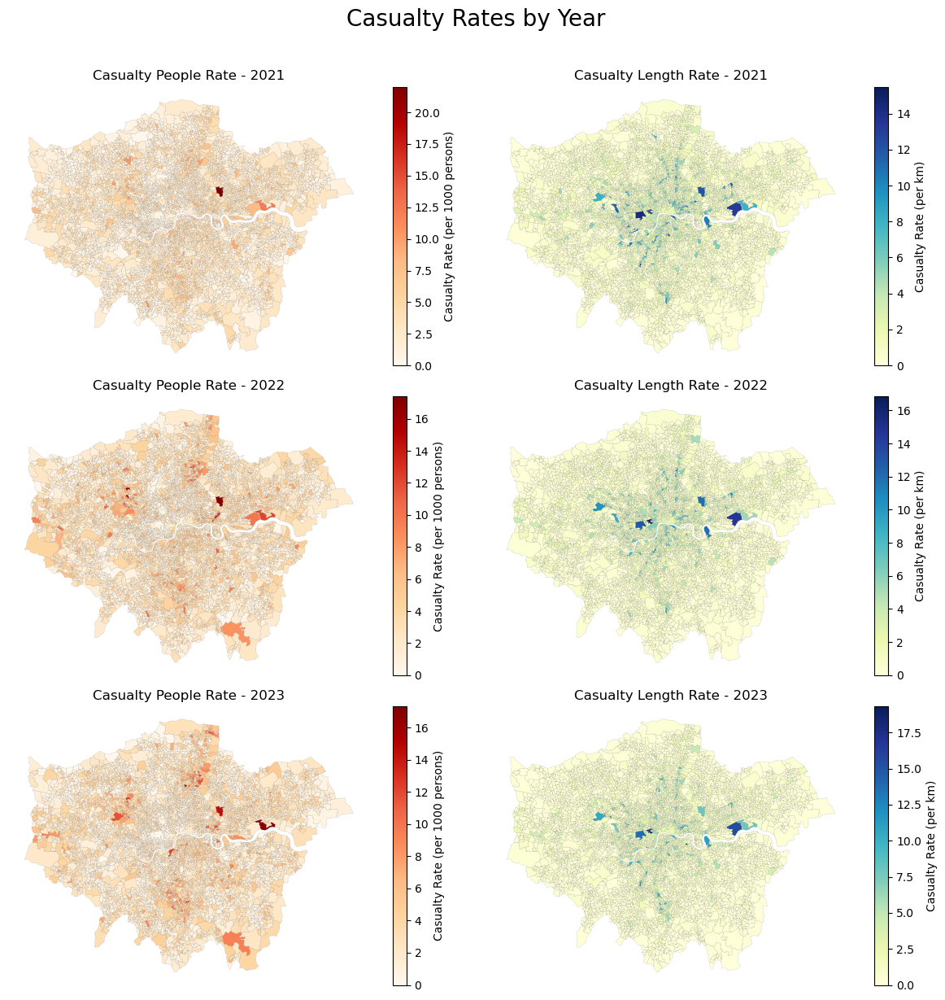

In [74]:
# 创建一个 3 行 2 列的子图布局
fig, axes = plt.subplots(3, 2, figsize=(12, 12))
fig.suptitle("Casualty Rates by Year", fontsize=20, y=1.02)  # 总标题

# 定义标题
titles = ['2021', '2022', '2023']
# people_rate_range = (0, 60)   # 固定范围：0-80
# length_rate_range = (0, 15)   # 固定范围：0-18

# 遍历每年的结果，绘制两种指标的地图
for i, year in enumerate([2021, 2022, 2023]):
    # 绘制 casualty_people_rate
    results[year].plot(column='casualty_people_rate', ax=axes[i, 0], cmap='OrRd',
                    legend=True, edgecolor='grey', linewidth=0.1,
                    legend_kwds={'label': "Casualty Rate (per 1000 persons)"},
                    )  # 设置固定范围 vmin=people_rate_range[0], vmax=people_rate_range[1]
    
    axes[i, 0].set_title(f'Casualty People Rate - {year}')
    axes[i, 0].axis('off')  # 隐藏坐标轴
    
    # 绘制 casualty_length_rate
    results[year].plot(column='casualty_length_rate', ax=axes[i, 1], cmap='YlGnBu',
                    legend=True, edgecolor='grey', linewidth=0.1,
                    legend_kwds={'label': "Casualty Rate (per km)"},
                    ) #vmin=length_rate_range[0], vmax=length_rate_range[1]
    
    axes[i, 1].set_title(f'Casualty Length Rate - {year}')
    axes[i, 1].axis('off')  # 隐藏坐标轴

# 调整布局并显示图形
plt.tight_layout()
plt.show()


C:\Users\YU\AppData\Local\Temp\ipykernel_1824\175264768.py:30: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.
  cmap_people = cm.get_cmap('OrRd', num_bins)  # 使用OrRd色带
C:\Users\YU\AppData\Local\Temp\ipykernel_1824\175264768.py:31: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.
  cmap_length = cm.get_cmap('YlGnBu', num_bins)  # 使用YlGnBu色带
C:\Users\YU\AppData\Local\Temp\ipykernel_1824\175264768.py:30: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.
  cmap_people = cm.get_cmap('OrRd', num_

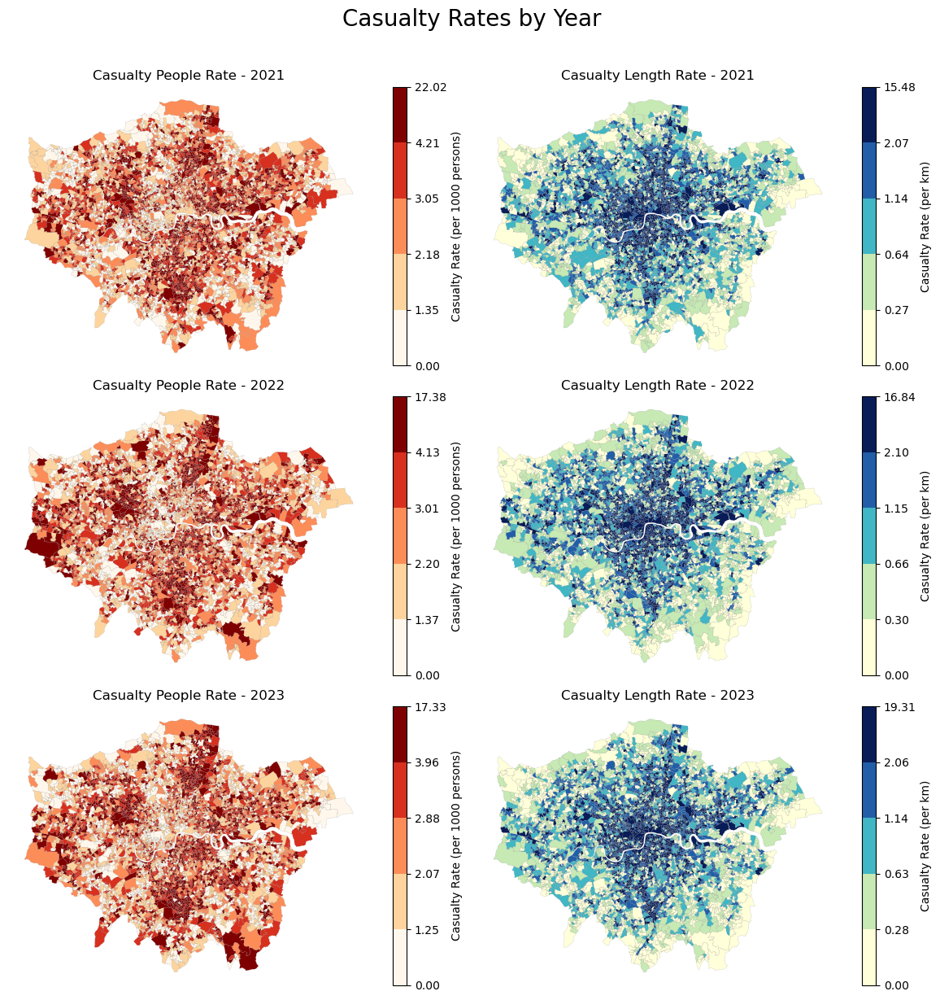

In [75]:
import matplotlib.pyplot as plt
import matplotlib.cm as cm
import matplotlib.colors as mcolors
import numpy as np

# 创建一个 3 行 2 列的子图布局
fig, axes = plt.subplots(3, 2, figsize=(12, 12))
fig.suptitle("Casualty Rates by Year", fontsize=20, y=1.02)  # 总标题

# 定义标题
titles = ['2021', '2022', '2023']

# 定义分段数量
num_bins = 5

# 遍历每年的结果，绘制两种指标的地图
for i, year in enumerate([2021, 2022, 2023]):
    # 获取数据
    casualty_people_rate = results[year]['casualty_people_rate']
    casualty_length_rate = results[year]['casualty_length_rate']
    
    # 计算分段边界（将数据划分为5个区间）
    breaks_people = np.percentile(casualty_people_rate, np.linspace(0, 100, num_bins + 1))  # 5个分段边界
    breaks_length = np.percentile(casualty_length_rate, np.linspace(0, 100, num_bins + 1))  # 5个分段边界
    
    # 创建颜色映射对象
    norm_people = mcolors.BoundaryNorm(breaks_people, ncolors=num_bins, clip=True)
    norm_length = mcolors.BoundaryNorm(breaks_length, ncolors=num_bins, clip=True)
    
    cmap_people = cm.get_cmap('OrRd', num_bins)  # 使用OrRd色带
    cmap_length = cm.get_cmap('YlGnBu', num_bins)  # 使用YlGnBu色带

    # 绘制 casualty_people_rate
    results[year].plot(column='casualty_people_rate', ax=axes[i, 0], cmap=cmap_people,
                       legend=True, edgecolor='grey', linewidth=0.1, norm=norm_people,
                       legend_kwds={'label': "Casualty Rate (per 1000 persons)"})
    axes[i, 0].set_title(f'Casualty People Rate - {year}')
    axes[i, 0].axis('off')  # 隐藏坐标轴
    
    # 绘制 casualty_length_rate
    results[year].plot(column='casualty_length_rate', ax=axes[i, 1], cmap=cmap_length,
                       legend=True, edgecolor='grey', linewidth=0.1, norm=norm_length,
                       legend_kwds={'label': "Casualty Rate (per km)"})
    axes[i, 1].set_title(f'Casualty Length Rate - {year}')
    axes[i, 1].axis('off')  # 隐藏坐标轴


# 调整布局并显示图形
plt.tight_layout()
plt.subplots_adjust(wspace=0.005)
plt.show()


C:\Users\YU\AppData\Local\Temp\ipykernel_1824\2833933320.py:20: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.
  cmap_people = cm.get_cmap('OrRd', num_bins)  # 使用OrRd色带
C:\Users\YU\AppData\Local\Temp\ipykernel_1824\2833933320.py:20: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.
  cmap_people = cm.get_cmap('OrRd', num_bins)  # 使用OrRd色带
C:\Users\YU\AppData\Local\Temp\ipykernel_1824\2833933320.py:20: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.
  cmap_people = cm.get_cmap('OrRd', num_b

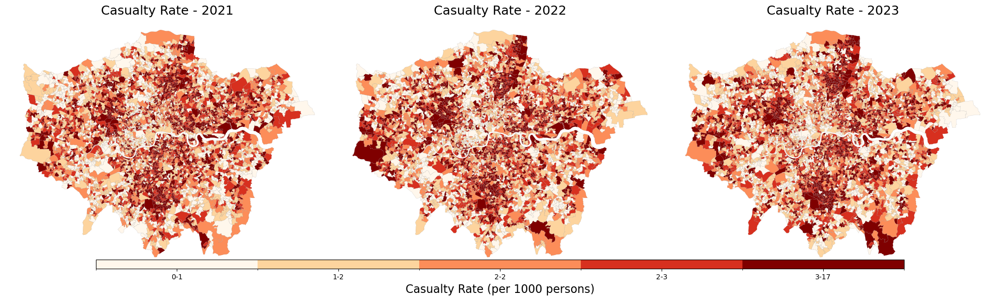

In [76]:
# 创建一个 1 行 3 列的子图布局
fig, axes = plt.subplots(1, 3, figsize=(20, 6))

# 定义标题
titles = ['2021', '2022', '2023']

# 定义分段数量
num_bins = 5

# 遍历每年的结果，绘制每年的地图
for i, year in enumerate([2021, 2022, 2023]):
    # 获取数据
    casualty_people_rate = results[year]['casualty_people_rate']
    
    # 计算分段边界（将数据划分为5个区间）
    breaks_people = np.percentile(casualty_people_rate, np.linspace(0, 100, num_bins + 1))  # 5个分段边界
    
    # 创建颜色映射对象
    norm_people = mcolors.BoundaryNorm(breaks_people, ncolors=num_bins, clip=True)
    cmap_people = cm.get_cmap('OrRd', num_bins)  # 使用OrRd色带

    # 绘制 casualty_people_rate
    results[year].plot(column='casualty_people_rate', ax=axes[i], cmap=cmap_people,
                    legend=False, edgecolor='grey', linewidth=0.1, norm=norm_people)
    axes[i].set_title(f'Casualty Rate - {year}', fontsize=18)
    axes[i].axis('off')  # 隐藏坐标轴

# 添加统一的图例（仅添加一次）
cbar_ax1 = fig.add_axes([0.1, 0.15, 0.8, 0.03])  # 设置图例的位置
sm_people = cm.ScalarMappable(cmap=cmap_people, norm=norm_people)
cbar_people = fig.colorbar(sm_people, cax=cbar_ax1, orientation='horizontal', boundaries=breaks_people)
tick_labels_people = [f'{int(breaks_people[i])}-{int(breaks_people[i + 1])}' for i in range(num_bins)]
cbar_people.set_ticks(breaks_people[:-1] + np.diff(breaks_people) / 2)
cbar_people.set_ticklabels(tick_labels_people)
cbar_people.set_label('Casualty Rate (per 1000 persons)', fontsize=16)

# 调整布局并显示图形
plt.tight_layout()
plt.subplots_adjust(wspace=0.01, hspace=0.01, bottom=0.15)   # 调整子图和图例之间的间距
plt.show()

C:\Users\YU\AppData\Local\Temp\ipykernel_1824\2283996343.py:73: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.
  cmap_people = cm.get_cmap('OrRd', num_bins)  # 使用OrRd色带
C:\Users\YU\AppData\Local\Temp\ipykernel_1824\2283996343.py:98: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout()


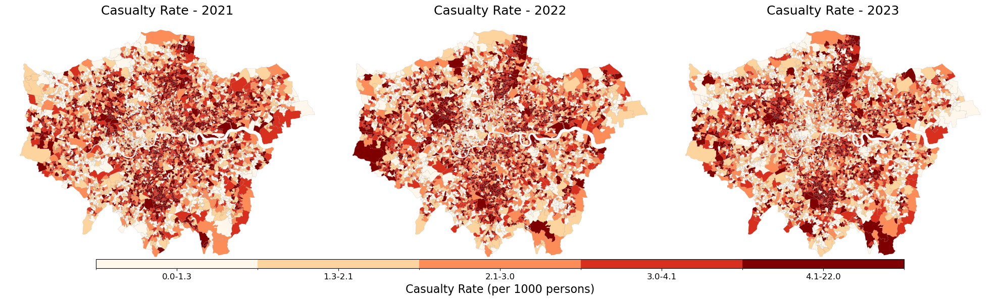

In [77]:
# import matplotlib.pyplot as plt
# import matplotlib.cm as cm
# import matplotlib.colors as mcolors
# import numpy as np

# # 创建一个 1 行 3 列的子图布局
# fig, axes = plt.subplots(1, 3, figsize=(20, 6))

# # 定义标题
# titles = ['2021', '2022', '2023']

# # 定义分段数量
# num_bins = 5

# # 获取所有年份的合并数据
# all_casualty_people_rate = np.concatenate([results[year]['casualty_people_rate'] for year in [2021, 2022, 2023]])

# # 计算合并数据的分段边界（将数据划分为5个区间）
# breaks_people = np.percentile(all_casualty_people_rate, np.linspace(0, 100, num_bins + 1))  # 5个分段边界

# # 创建颜色映射对象
# norm_people = mcolors.BoundaryNorm(breaks_people, ncolors=num_bins, clip=True)
# cmap_people = cm.get_cmap('OrRd', num_bins)  # 使用OrRd色带

# # 遍历每年的结果，绘制每年的地图
# for i, year in enumerate([2021, 2022, 2023]):
#     # 获取数据
#     casualty_people_rate = results[year]['casualty_people_rate']

#     # 绘制 casualty_people_rate
#     results[year].plot(column='casualty_people_rate', ax=axes[i], cmap=cmap_people,
#                     legend=False, edgecolor='grey', linewidth=0.1, norm=norm_people)
#     axes[i].set_title(f'Casualty Rate - {year}', fontsize=18)
#     axes[i].axis('off')  # 隐藏坐标轴

# # 添加统一的图例（仅添加一次）
# cbar_ax1 = fig.add_axes([0.1, 0.15, 0.8, 0.03])  # 设置图例的位置
# sm_people = cm.ScalarMappable(cmap=cmap_people, norm=norm_people)
# cbar_people = fig.colorbar(sm_people, cax=cbar_ax1, orientation='horizontal', boundaries=breaks_people)
# tick_labels_people = [f'{int(breaks_people[i])}-{int(breaks_people[i + 1])}' for i in range(num_bins)]
# cbar_people.set_ticks(breaks_people[:-1] + np.diff(breaks_people) / 2)
# cbar_people.set_ticklabels(tick_labels_people, fontsize=12)
# cbar_people.set_label('Casualty Rate (per 1000 persons)', fontsize=16)

# # 调整布局并显示图形
# plt.tight_layout()
# plt.subplots_adjust(wspace=0.01, hspace=0.01, bottom=0.15)   # 调整子图和图例之间的间距
# plt.show()


import matplotlib.pyplot as plt
import matplotlib.cm as cm
import matplotlib.colors as mcolors
import numpy as np

# 创建一个 1 行 3 列的子图布局
fig, axes = plt.subplots(1, 3, figsize=(20, 6))

# 定义标题
titles = ['2021', '2022', '2023']

# 定义分段数量
num_bins = 5

# 获取所有年份的合并数据
all_casualty_people_rate = np.concatenate([results[year]['casualty_people_rate'] for year in [2021, 2022, 2023]])

# 计算合并数据的分段边界（将数据划分为5个区间）
breaks_people = np.percentile(all_casualty_people_rate, np.linspace(0, 100, num_bins + 1))  # 5个分段边界

# 创建颜色映射对象
norm_people = mcolors.BoundaryNorm(breaks_people, ncolors=num_bins, clip=True)
cmap_people = cm.get_cmap('OrRd', num_bins)  # 使用OrRd色带

# 遍历每年的结果，绘制每年的地图
for i, year in enumerate([2021, 2022, 2023]):
    # 获取数据
    casualty_people_rate = results[year]['casualty_people_rate']

    # 绘制 casualty_people_rate
    results[year].plot(column='casualty_people_rate', ax=axes[i], cmap=cmap_people,
                       legend=False, edgecolor='grey', linewidth=0.1, norm=norm_people)
    axes[i].set_title(f'Casualty Rate - {year}', fontsize=18)
    axes[i].axis('off')  # 隐藏坐标轴

# 添加统一的图例（仅添加一次）
cbar_ax1 = fig.add_axes([0.1, 0.15, 0.8, 0.03])  # 设置图例的位置
sm_people = cm.ScalarMappable(cmap=cmap_people, norm=norm_people)
cbar_people = fig.colorbar(sm_people, cax=cbar_ax1, orientation='horizontal', boundaries=breaks_people)

# 格式化 tick labels，保留1位小数
tick_labels_people = [f'{breaks_people[i]:.1f}-{breaks_people[i + 1]:.1f}' for i in range(num_bins)]
cbar_people.set_ticks(breaks_people[:-1] + np.diff(breaks_people) / 2)
cbar_people.set_ticklabels(tick_labels_people, fontsize=12)  # 设置刻度标签
cbar_people.set_label('Casualty Rate (per 1000 persons)', fontsize=16)

# 调整布局并显示图形
plt.tight_layout()
plt.subplots_adjust(wspace=0.01, hspace=0.01, bottom=0.15)   # 调整子图和图例之间的间距
plt.show()


C:\Users\YU\AppData\Local\Temp\ipykernel_1824\3378600223.py:23: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.
  cmap_people = cm.get_cmap('OrRd', num_bins)  # 使用OrRd色带
C:\Users\YU\AppData\Local\Temp\ipykernel_1824\3378600223.py:57: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout()


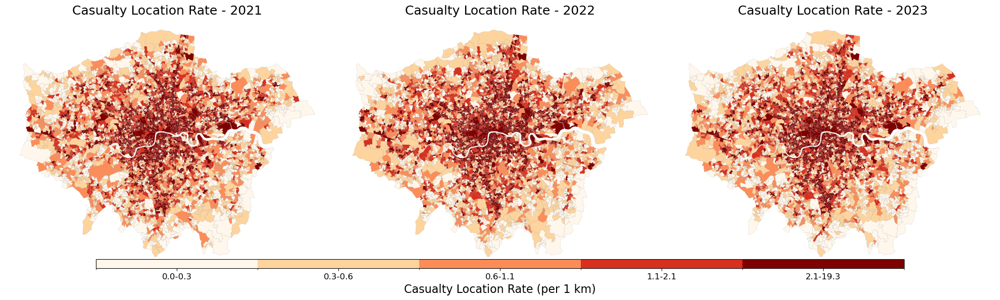

In [78]:
import matplotlib.pyplot as plt
import matplotlib.cm as cm
import matplotlib.colors as mcolors
import numpy as np

# 创建一个 1 行 3 列的子图布局
fig, axes = plt.subplots(1, 3, figsize=(20, 6))

# 定义标题
titles = ['2021', '2022', '2023']

# 定义分段数量
num_bins = 5

# 获取所有年份的合并数据
all_casualty_location_people_rate = np.concatenate([results[year]['casualty_length_rate'] for year in [2021, 2022, 2023]])

# 计算合并数据的分段边界（将数据划分为5个区间）
breaks_people = np.percentile(all_casualty_location_people_rate, np.linspace(0, 100, num_bins + 1))  # 5个分段边界

# 创建颜色映射对象
norm_people = mcolors.BoundaryNorm(breaks_people, ncolors=num_bins, clip=True)
cmap_people = cm.get_cmap('OrRd', num_bins)  # 使用OrRd色带

# 遍历每年的结果，绘制每年的地图
for i, year in enumerate([2021, 2022, 2023]):
    # 获取数据
    casualty_location_rate = results[year]['casualty_length_rate']

    # 绘制 casualty_people_rate
    results[year].plot(column='casualty_length_rate', ax=axes[i], cmap=cmap_people,
                    legend=False, edgecolor='grey', linewidth=0.1, norm=norm_people)
    axes[i].set_title(f'Casualty Location Rate - {year}', fontsize=18)
    axes[i].axis('off')  # 隐藏坐标轴

# # 添加统一的图例（仅添加一次）
# cbar_ax1 = fig.add_axes([0.1, 0.15, 0.8, 0.03])  # 设置图例的位置
# sm_people = cm.ScalarMappable(cmap=cmap_people, norm=norm_people)
# cbar_people = fig.colorbar(sm_people, cax=cbar_ax1, orientation='horizontal', boundaries=breaks_people)
# tick_labels_people = [f'{int(breaks_people[i])}-{int(breaks_people[i + 1])}' for i in range(num_bins)]
# cbar_people.set_ticks(breaks_people[:-1] + np.diff(breaks_people) / 2)
# cbar_people.set_ticklabels(tick_labels_people, fontsize=12)
# cbar_people.set_label('Casualty Location Rate (per 1 km)', fontsize=16)

# 添加统一的图例（仅添加一次）
cbar_ax1 = fig.add_axes([0.1, 0.15, 0.8, 0.03])  # 设置图例的位置
sm_people = cm.ScalarMappable(cmap=cmap_people, norm=norm_people)
cbar_people = fig.colorbar(sm_people, cax=cbar_ax1, orientation='horizontal', boundaries=breaks_people)

# 格式化 tick labels，保留1位小数
tick_labels_people = [f'{breaks_people[i]:.1f}-{breaks_people[i + 1]:.1f}' for i in range(num_bins)]
cbar_people.set_ticks(breaks_people[:-1] + np.diff(breaks_people) / 2)  # 设置刻度位置
cbar_people.set_ticklabels(tick_labels_people, fontsize=12)  # 设置刻度标签
cbar_people.set_label('Casualty Location Rate (per 1 km)', fontsize=16)

# 调整布局并显示图形
plt.tight_layout()
plt.subplots_adjust(wspace=0.01, hspace=0.01, bottom=0.15)   # 调整子图和图例之间的间距
plt.show()

In [79]:
res2021.to_file('data/results/res2021.gpkg', driver='gpkg')
res2022.to_file('data/results/res2022.gpkg', driver='gpkg')
res2023.to_file('data/results/res2023.gpkg', driver='gpkg')

# More in **Visualisation.Rmd**

# Privation map

In [80]:
lsoa_space.head()
lsoa_space.info()

<class 'geopandas.geodataframe.GeoDataFrame'>
RangeIndex: 4835 entries, 0 to 4834
Data columns (total 22 columns):
 #   Column               Non-Null Count  Dtype   
---  ------               --------------  -----   
 0   lsoa                 4835 non-null   object  
 1   LSOA11NM             4835 non-null   object  
 2   MSOA11CD             4835 non-null   object  
 3   MSOA11NM             4835 non-null   object  
 4   LAD11CD              4835 non-null   object  
 5   LAD11NM              4835 non-null   object  
 6   RGN11CD              4835 non-null   object  
 7   RGN11NM              4835 non-null   object  
 8   USUALRES             4835 non-null   int32   
 9   HHOLDRES             4835 non-null   int32   
 10  COMESTRES            4835 non-null   int32   
 11  POPDEN               4835 non-null   float64 
 12  HHOLDS               4835 non-null   int32   
 13  AVHHOLDSZ            4835 non-null   float64 
 14  geometry             4835 non-null   geometry
 15  area_km2     

In [81]:
information.head()

,Census Year,lsoa,Road Length,Population,IMD Decile
4835,2021,E01000001,2855.474246,1475,9
4836,2021,E01000002,4288.325821,1384,10
4837,2021,E01000003,1073.346027,1616,5
4838,2021,E01000005,4528.304022,1103,3
4839,2021,E01000006,2703.273461,1845,5


In [82]:
res2021.head()

,lsoa,geometry,year,count_casualty,Census Year,Road Length,Population,IMD Decile,casualty_people_rate,count_collision,casualty_length_rate
0,E01000001,"POLYGON ((-0.09729 51.52158, -0.09652 51.52027...",NaN,NaN,2021.0,2855.474246,1475.0,9.0,0.000000,4.0,1.400818
1,E01000002,"POLYGON ((-0.08813 51.51941, -0.08929 51.51752...",2021.0,2.0,2021.0,4288.325821,1384.0,10.0,1.445087,4.0,0.932765
2,E01000003,"POLYGON ((-0.09679 51.52325, -0.09647 51.52282...",2021.0,2.0,2021.0,1073.346027,1616.0,5.0,1.237624,1.0,0.931666
3,E01000005,"POLYGON ((-0.07323 51.51, -0.07553 51.50974, -...",2021.0,1.0,2021.0,4528.304022,1103.0,3.0,0.906618,19.0,4.195831
4,E01000006,"POLYGON ((0.09115 51.53909, 0.09326 51.53787, ...",2021.0,2.0,2021.0,2703.273461,1845.0,5.0,1.084011,NaN,0.000000


In [83]:
lsoa_IDM = pd.merge(lsoa_space[['lsoa','geometry']], information[['lsoa','IMD Decile']], on='lsoa', how='left').rename(columns={'IMD Decile':'IMD'})
lsoa_IDM = pd.merge(lsoa_IDM, res2021[['lsoa', 'casualty_people_rate', 'casualty_length_rate']], on='lsoa', how='left').rename(columns={'casualty_people_rate':'casualty_rate_2021','casualty_length_rate':'casualty_location_rate_2021'})
lsoa_IDM = pd.merge(lsoa_IDM, res2022[['lsoa', 'casualty_people_rate', 'casualty_length_rate']], on='lsoa', how='left').rename(columns={'casualty_people_rate':'casualty_rate_2022','casualty_length_rate':'casualty_location_rate_2022'})
lsoa_IDM = pd.merge(lsoa_IDM, res2023[['lsoa', 'casualty_people_rate', 'casualty_length_rate']], on='lsoa', how='left').rename(columns={'casualty_people_rate':'casualty_rate_2023','casualty_length_rate':'casualty_location_rate_2023'})

lsoa_IDM

,lsoa,geometry,IMD,casualty_rate_2021,casualty_location_rate_2021,casualty_rate_2022,casualty_location_rate_2022,casualty_rate_2023,casualty_location_rate_2023
0,E01000001,"POLYGON ((-0.09729 51.52158, -0.09652 51.52027...",9.0,0.000000,1.400818,0.000000,0.700409,0.677966,2.451432
1,E01000002,"POLYGON ((-0.08813 51.51941, -0.08929 51.51752...",10.0,1.445087,0.932765,0.722543,1.865530,0.000000,0.466382
2,E01000003,"POLYGON ((-0.09679 51.52325, -0.09647 51.52282...",5.0,1.237624,0.931666,0.618812,0.000000,2.475248,0.000000
3,E01000005,"POLYGON ((-0.07323 51.51, -0.07553 51.50974, -...",3.0,0.906618,4.195831,4.533092,2.429166,1.813237,3.533332
4,E01000006,"POLYGON ((0.09115 51.53909, 0.09326 51.53787, ...",5.0,1.084011,0.000000,0.542005,0.369922,3.252033,0.369922
...,...,...,...,...,...,...,...,...,...
4830,E01033742,"POLYGON ((0.0824 51.49886, 0.08415 51.49803, 0...",7.0,0.746826,0.000000,1.493652,0.000000,3.734130,0.000000
4831,E01033743,"POLYGON ((0.11081 51.5098, 0.11227 51.50782, 0...",5.0,2.060793,0.000000,1.545595,0.362317,0.000000,0.000000
4832,E01033744,"POLYGON ((0.08072 51.4955, 0.08165 51.49491, 0...",3.0,0.000000,0.652746,1.663894,0.326373,1.663894,0.000000
4833,E01033745,"POLYGON ((0.10806 51.50135, 0.10664 51.50021, ...",4.0,2.804262,0.754753,3.925967,1.725150,0.000000,0.215644


In [84]:
lsoa_IDM.isna().sum()

lsoa                             0
geometry                         0
IMD                            176
casualty_rate_2021               0
casualty_location_rate_2021      0
casualty_rate_2022               0
casualty_location_rate_2022      0
casualty_rate_2023               0
casualty_location_rate_2023      0
dtype: int64

`There ara a small part of lsoa missing IMD values, I use interpolation to fill those empty values.`

What I use is **最近邻插值（Nearest Neighbor Interpolation）**

In [85]:
from scipy.spatial import cKDTree
import numpy as np

# 获取 LSOA 的几何中心
lsoa_IDM['centroid'] = lsoa_IDM.geometry.centroid

# 筛选出有和无 IMD 的 LSOA
known = lsoa_IDM.dropna(subset=['IMD'])
unknown = lsoa_IDM[lsoa_IDM['IMD'].isna()]

# 构建 KD-Tree 用于最近邻搜索
tree = cKDTree(np.array(list(zip(known.centroid.x, known.centroid.y))))

# 获取最近的邻居索引
_, idx = tree.query(np.array(list(zip(unknown.centroid.x, unknown.centroid.y))), k=3)

# 处理 nearest_values 以确保格式正确
nearest_values = known['IMD'].values[idx]  # 使用 numpy 数组直接索引

# 计算最近邻的平均 IMD 值并四舍五入为整数
filled_values = np.round(np.nanmean(nearest_values, axis=1)).astype(int)

# 用计算出的值填充未知值
lsoa_IDM.loc[lsoa_IDM['IMD'].isna(), 'IMD'] = filled_values



C:\Users\YU\AppData\Local\Temp\ipykernel_1824\1701635034.py:5: UserWarning: Geometry is in a geographic CRS. Results from 'centroid' are likely incorrect. Use 'GeoSeries.to_crs()' to re-project geometries to a projected CRS before this operation.

  lsoa_IDM['centroid'] = lsoa_IDM.geometry.centroid
C:\Users\YU\AppData\Local\Temp\ipykernel_1824\1701635034.py:12: UserWarning: Geometry is in a geographic CRS. Results from 'centroid' are likely incorrect. Use 'GeoSeries.to_crs()' to re-project geometries to a projected CRS before this operation.

  tree = cKDTree(np.array(list(zip(known.centroid.x, known.centroid.y))))
C:\Users\YU\AppData\Local\Temp\ipykernel_1824\1701635034.py:15: UserWarning: Geometry is in a geographic CRS. Results from 'centroid' are likely incorrect. Use 'GeoSeries.to_crs()' to re-project geometries to a projected CRS before this operation.

  _, idx = tree.query(np.array(list(zip(unknown.centroid.x, unknown.centroid.y))), k=3)


In [86]:
lsoa_IDM.isna().sum()

lsoa                           0
geometry                       0
IMD                            0
casualty_rate_2021             0
casualty_location_rate_2021    0
casualty_rate_2022             0
casualty_location_rate_2022    0
casualty_rate_2023             0
casualty_location_rate_2023    0
centroid                       0
dtype: int64

In [87]:
lsoa_IDM

,lsoa,geometry,IMD,casualty_rate_2021,casualty_location_rate_2021,casualty_rate_2022,casualty_location_rate_2022,casualty_rate_2023,casualty_location_rate_2023,centroid
0,E01000001,"POLYGON ((-0.09729 51.52158, -0.09652 51.52027...",9.0,0.000000,1.400818,0.000000,0.700409,0.677966,2.451432,POINT (-0.09678 51.51801)
1,E01000002,"POLYGON ((-0.08813 51.51941, -0.08929 51.51752...",10.0,1.445087,0.932765,0.722543,1.865530,0.000000,0.466382,POINT (-0.09255 51.51821)
2,E01000003,"POLYGON ((-0.09679 51.52325, -0.09647 51.52282...",5.0,1.237624,0.931666,0.618812,0.000000,2.475248,0.000000,POINT (-0.09581 51.52172)
3,E01000005,"POLYGON ((-0.07323 51.51, -0.07553 51.50974, -...",3.0,0.906618,4.195831,4.533092,2.429166,1.813237,3.533332,POINT (-0.07581 51.51355)
4,E01000006,"POLYGON ((0.09115 51.53909, 0.09326 51.53787, ...",5.0,1.084011,0.000000,0.542005,0.369922,3.252033,0.369922,POINT (0.08844 51.53898)
...,...,...,...,...,...,...,...,...,...,...
4830,E01033742,"POLYGON ((0.0824 51.49886, 0.08415 51.49803, 0...",7.0,0.746826,0.000000,1.493652,0.000000,3.734130,0.000000,POINT (0.08143 51.49688)
4831,E01033743,"POLYGON ((0.11081 51.5098, 0.11227 51.50782, 0...",5.0,2.060793,0.000000,1.545595,0.362317,0.000000,0.000000,POINT (0.09886 51.50564)
4832,E01033744,"POLYGON ((0.08072 51.4955, 0.08165 51.49491, 0...",3.0,0.000000,0.652746,1.663894,0.326373,1.663894,0.000000,POINT (0.08073 51.49418)
4833,E01033745,"POLYGON ((0.10806 51.50135, 0.10664 51.50021, ...",4.0,2.804262,0.754753,3.925967,1.725150,0.000000,0.215644,POINT (0.10449 51.50009)


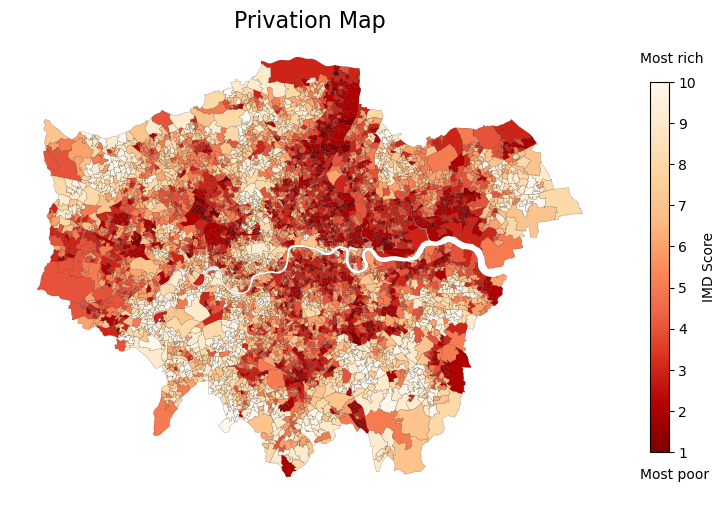

In [88]:
import matplotlib.pyplot as plt
import matplotlib.cm as cm

# 创建图形和坐标轴
fig, ax = plt.subplots(figsize=(12, 6))

# 绘制地图，使用反转色带
lsoa_IDM.plot(column='IMD', legend=True, 
              edgecolor='black', linewidth=0.1,
              legend_kwds={
                  'shrink': 0.8,           # 缩小图例高度
                  'label': 'IMD Score',    # 图例标签
                  'orientation': 'vertical' # 垂直方向图例
              },
              cmap='OrRd_r', ax=ax,)  # 反转色带使用 'OrRd_r'

# 隐藏坐标轴
ax.axis('off')

# 设置标题
ax.set_title('Privation Map', fontsize=16)

ax.text(1.05, 0.95, 'Most rich', transform=ax.transAxes,
        fontsize=10, color='black', va='center')
ax.text(1.05, 0.05, 'Most poor', transform=ax.transAxes,
        fontsize=10, color='black', va='center')

plt.subplots_adjust(right=0.8)

plt.show()

`The below concluded from rmd file`

The casualty rate hotspot areas are primarily located in:

- the northeastern part of Enfield, 
- the entire eastern half of Haringey, 
- the central area of Brent, and 
- the junctions of Waltham Forest, Hackney, Tower Hamlets, and Newham boroughs. Additionally, 
- the central region of Southwark and 
- southern part of Barking and dagenham as well as 
- the border areas shared by Merton, Lambeth, Croydon, and Sutton boroughs 

are also identified as hotspots. These areas suggest a higher risk of traffic-related injuries for residents.

Conversely, 
- the northern part of Hillingdon, 
- the eastern part of Havering, 
- the western part of Westminster, and 
- the eastern part of Kensington and Chelsea, along with 
- the central regions of Bexley and Bromley, are identified as cold spots. 
- The junction area of Barnet, Camden, and Haringey boroughs 
- the City of london
- central area of Richmond upon Thames

is also considered a cold spot, indicating that residents in these areas are comparatively safer.

<Axes: >

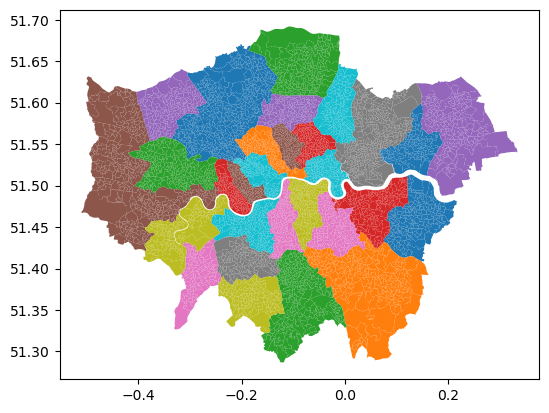

In [89]:
lsoa_space.plot(column='LAD11NM', edgecolor='none')

> 莫兰指数 (Moran's I)

In [90]:
import libpysal as lps
from esda import Moran

# 计算空间权重矩阵
w = lps.weights.KNN.from_dataframe(lsoa_IDM, k=5)  # 5个邻居

# 计算莫兰指数
moran = Moran(lsoa_IDM['IMD'], w)

# 打印莫兰指数
print(f"Moran's I: {moran.I}")
print(f"p-value: {moran.p_sim}")


Moran's I: 0.6404150623508751
p-value: 0.001


### Interpretation:
- 如果莫兰指数I接近1，则表明数据呈现明显的正空间自相关（即邻近区域的IMD值较为相似）。
- 如果莫兰指数I接近-1，则表明数据呈现负空间自相关（即邻近区域的IMD值差异较大）。
- 如果莫兰指数I接近0，则表明数据没有空间自相关，空间上是随机分布的。

Pearson Correlation Coefficient: -0.39


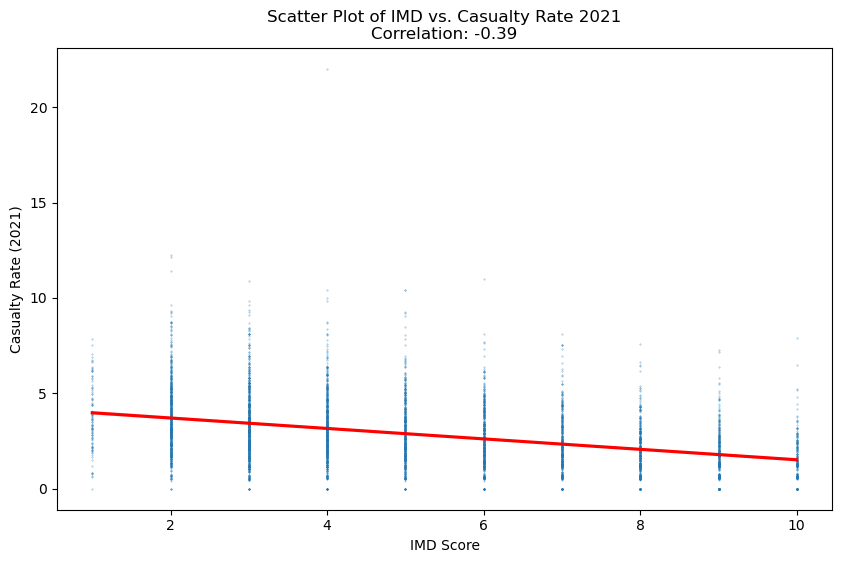

In [141]:
import matplotlib.pyplot as plt
import seaborn as sns
import numpy as np

# 计算皮尔逊相关系数
correlation = lsoa_IDM['IMD'].corr(lsoa_IDM['casualty_rate_2021'])
print(f"Pearson Correlation Coefficient: {correlation:.2f}")

# 创建散点图并拟合回归线
plt.figure(figsize=(10, 6))
sns.regplot(
    data=lsoa_IDM,
    x='IMD',
    y='casualty_rate_2021',
    scatter_kws={'s': 0.1, 'alpha': 0.6},  # 设置点的透明度
    line_kws={'color': 'red'},   # 设置回归线颜色
    ci=95                        # 显示95%置信区间
)

# 添加标题和标签
plt.title(f'Scatter Plot of IMD vs. Casualty Rate 2021\nCorrelation: {correlation:.2f}')
plt.xlabel('IMD Score')
plt.ylabel('Casualty Rate (2021)')
plt.show()



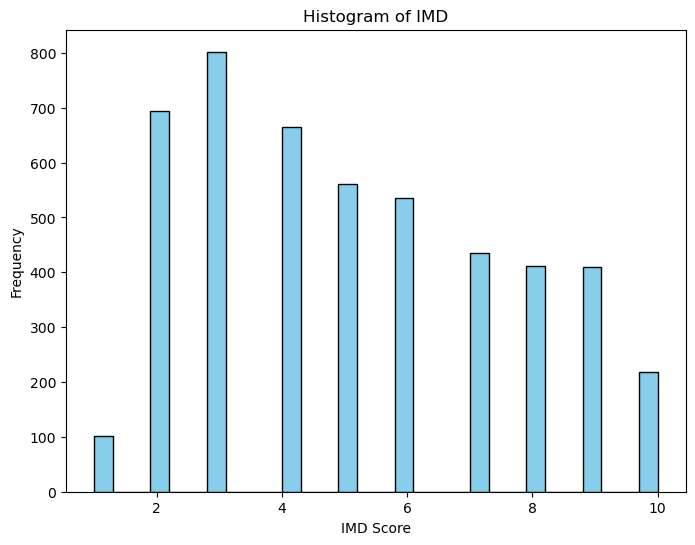

In [131]:
import matplotlib.pyplot as plt

# 绘制 IMD 的直方图
plt.figure(figsize=(8, 6))
plt.hist(lsoa_IDM['IMD'], bins=30, color='skyblue', edgecolor='black')
plt.title('Histogram of IMD')
plt.xlabel('IMD Score')
plt.ylabel('Frequency')
plt.show()

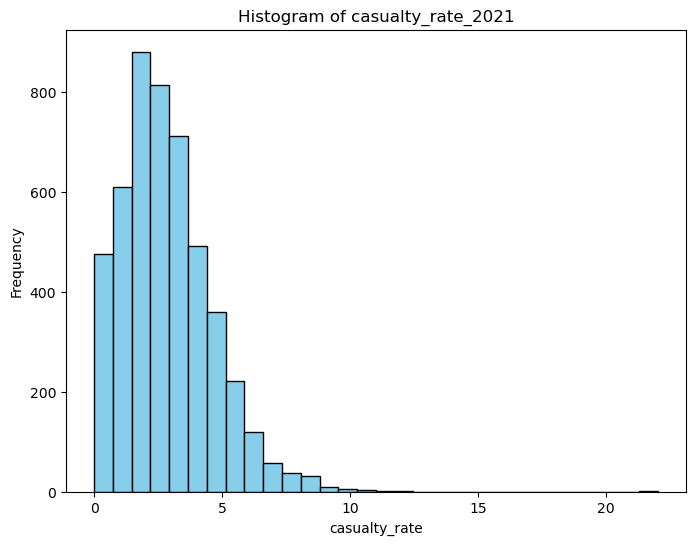

In [139]:
# 绘制 IMD 的直方图
plt.figure(figsize=(8, 6))
plt.hist(lsoa_IDM['casualty_rate_2021'], bins=30, color='skyblue', edgecolor='black')
plt.title('Histogram of casualty_rate_2021')
plt.xlabel('casualty_rate')
plt.ylabel('Frequency')
plt.show()



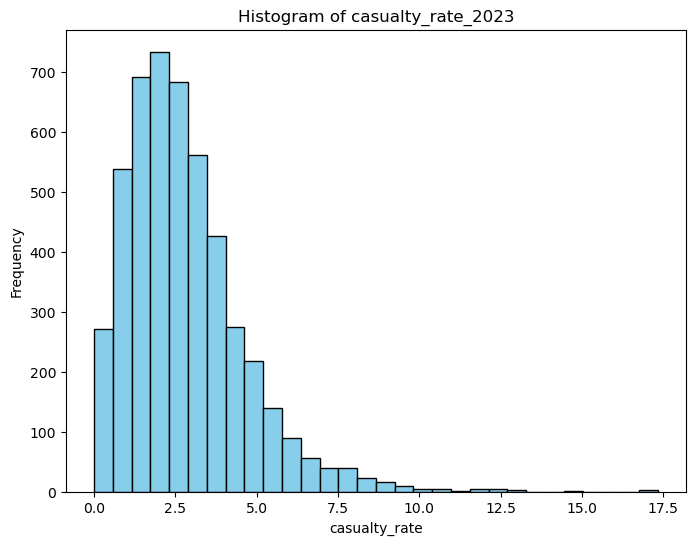

In [140]:
# 绘制 IMD 的直方图
plt.figure(figsize=(8, 6))
plt.hist(lsoa_IDM['casualty_rate_2023'], bins=30, color='skyblue', edgecolor='black')
plt.title('Histogram of casualty_rate_2023')
plt.xlabel('casualty_rate')
plt.ylabel('Frequency')
plt.show()

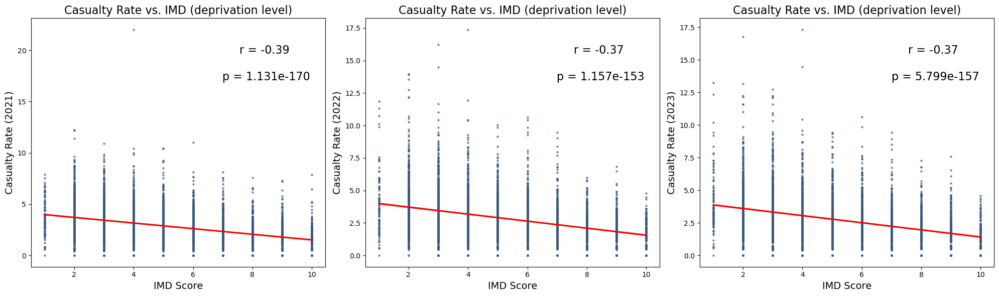

In [135]:
import matplotlib.pyplot as plt
import seaborn as sns
import numpy as np
from scipy.stats import pearsonr

# 创建 1 行 3 列的图形布局
fig, axes = plt.subplots(1, 3, figsize=(20, 6))

# 定义年份列表
years = [2021, 2022, 2023]

# 设置字体大小
title_fontsize = 16
label_fontsize = 14

# 遍历年份和子图
for i, year in enumerate(years):
    # 计算皮尔逊相关系数和 p 值
    correlation, p_value = pearsonr(
        lsoa_IDM['IMD'], 
        lsoa_IDM[f'casualty_rate_{year}']
    )
    
    # 绘制散点图并拟合回归线
    sns.regplot(
        data=lsoa_IDM,
        x='IMD',
        y=f'casualty_rate_{year}',
        scatter_kws={'s': 5, 'alpha': 0.6, 'color': '#3A5A7D'},
        line_kws={'color': 'red'},
        ci=95,
        ax=axes[i]
    )
    
    # 设置标题和轴标签
    axes[i].set_title(
        f'Casualty Rate vs. IMD (deprivation level)', 
        fontsize=title_fontsize
    )
    axes[i].set_xlabel('IMD Score', fontsize=label_fontsize)
    axes[i].set_ylabel(f'Casualty Rate ({year})', fontsize=label_fontsize)
    
    # 添加相关系数和 p 值到图的中间上方
    axes[i].text(
        0.8, 0.75,  # 位置 (以轴坐标比例计算)
        f'r = {correlation:.2f} \n\np = {p_value:.3e}',  # 格式化显示 r 和 p
        fontsize=16,
        ha='center', 
        transform=axes[i].transAxes
    )

# 调整布局
plt.tight_layout()
plt.show()


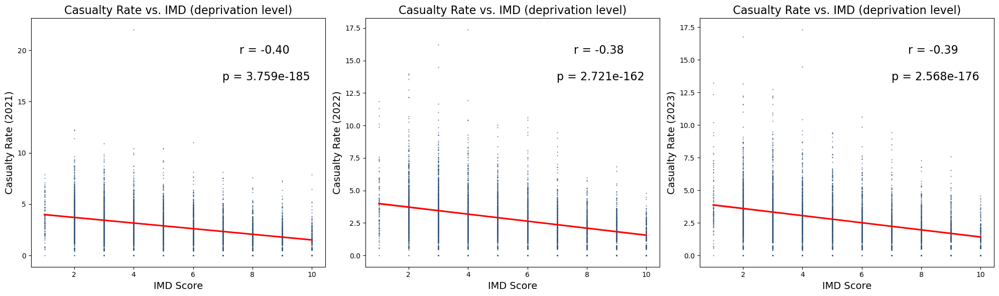

In [146]:
import matplotlib.pyplot as plt
import seaborn as sns
import numpy as np
from scipy.stats import spearmanr  # 导入斯皮尔曼等级相关系数

# 创建 1 行 3 列的图形布局
fig, axes = plt.subplots(1, 3, figsize=(20, 6))

# 定义年份列表
years = [2021, 2022, 2023]

# 设置字体大小
title_fontsize = 16
label_fontsize = 14

# 遍历年份和子图
for i, year in enumerate(years):
    # 计算斯皮尔曼等级相关系数和 p 值
    correlation, p_value = spearmanr(
        lsoa_IDM['IMD'], 
        lsoa_IDM[f'casualty_rate_{year}']
    )
    
    # 绘制散点图并拟合回归线
    sns.regplot(
        data=lsoa_IDM,
        x='IMD',
        y=f'casualty_rate_{year}',
        scatter_kws={'s': 0.5, 'alpha': 0.6, 'color': '#3A5A7D'},
        line_kws={'color': 'red'},
        ci=95,
        ax=axes[i]
    )
    
    # 设置标题和轴标签
    axes[i].set_title(
        f'Casualty Rate vs. IMD (deprivation level)', 
        fontsize=title_fontsize
    )
    axes[i].set_xlabel('IMD Score', fontsize=label_fontsize)
    axes[i].set_ylabel(f'Casualty Rate ({year})', fontsize=label_fontsize)
    
    # 添加相关系数和 p 值到图的中间上方
    axes[i].text(
        0.8, 0.75,  # 位置 (以轴坐标比例计算)
        f'r = {correlation:.2f} \n\np = {p_value:.3e}',  # 格式化显示 r 和 p
        fontsize=16,
        ha='center', 
        transform=axes[i].transAxes
    )

# 调整布局
plt.tight_layout()
plt.show()


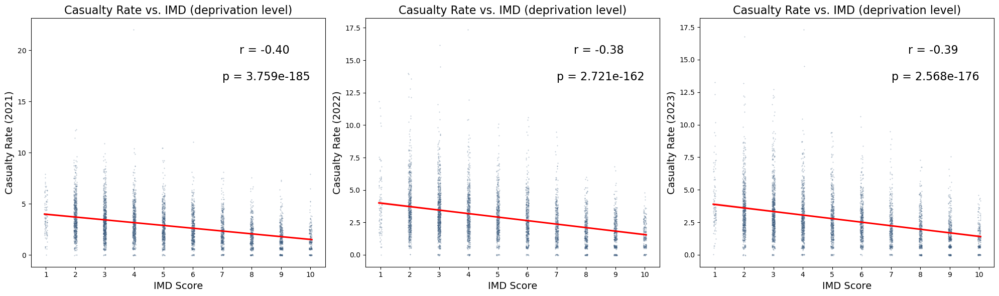

In [168]:
import matplotlib.pyplot as plt
import seaborn as sns
import numpy as np
from scipy.stats import spearmanr  # 导入斯皮尔曼等级相关系数

# 创建 1 行 3 列的图形布局
fig, axes = plt.subplots(1, 3, figsize=(20, 6))

# 定义年份列表
years = [2021, 2022, 2023]

# 设置字体大小
title_fontsize = 16
label_fontsize = 14

# 遍历年份和子图
for i, year in enumerate(years):
    # 计算斯皮尔曼等级相关系数和 p 值
    correlation, p_value = spearmanr(
        lsoa_IDM['IMD'], 
        lsoa_IDM[f'casualty_rate_{year}']
    )
    
    # 在 x 和 y 方向上添加抖动
    jittered_x = lsoa_IDM['IMD'] + np.random.uniform(-0.05, 0.05, size=lsoa_IDM.shape[0])
    jittered_y = lsoa_IDM[f'casualty_rate_{year}'] + np.random.uniform(-0.05, 0.05, size=lsoa_IDM.shape[0])
    
    # 绘制散点图并拟合回归线
    sns.regplot(
        x=jittered_x,
        y=jittered_y,
        scatter_kws={'s': 0.1, 'alpha': 0.6, 'color': '#3A5A7D'},
        line_kws={'color': 'red'},
        ci=95,
        ax=axes[i]
    )
    
    # 设置标题和轴标签
    axes[i].set_title(
        f'Casualty Rate vs. IMD (deprivation level)', 
        fontsize=title_fontsize
    )
    axes[i].set_xlabel('IMD Score', fontsize=label_fontsize)
    axes[i].set_ylabel(f'Casualty Rate ({year})', fontsize=label_fontsize)
    
    # 设置横坐标范围和刻度
    axes[i].set_xticks(range(1, 11))  # 设置横坐标为 1 到 10

    # 添加相关系数和 p 值到图的中间上方
    axes[i].text(
        0.8, 0.75,  # 位置 (以轴坐标比例计算)
        f'r = {correlation:.2f} \n\np = {p_value:.3e}',  # 格式化显示 r 和 p
        fontsize=16,
        ha='center', 
        transform=axes[i].transAxes
    )

# 调整布局
plt.tight_layout()
plt.show()


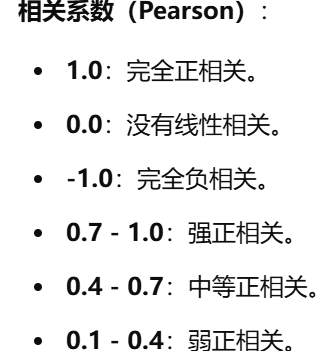

In [120]:
from scipy.stats import spearmanr

# 计算斯皮尔曼相关系数和p值
correlation, p_value = spearmanr(lsoa_IDM['IMD'], lsoa_IDM[f'casualty_rate_{year}'])

print(f'Spearman Correlation: r = {correlation:.2f}, p = {p_value:.3e}')


Spearman Correlation: r = -0.39, p = 2.568e-176


In [134]:
import statsmodels.api as sm

# 定义自变量 (IMD) 和因变量 (casualty_rate)
X = sm.add_constant(lsoa_IDM['IMD'])  # 添加常数项
y = lsoa_IDM[f'casualty_rate_2021']

# 拟合回归模型
model = sm.OLS(y, X).fit()

# 输出回归结果
print(model.summary())


                            OLS Regression Results                            
Dep. Variable:     casualty_rate_2021   R-squared:                       0.148
Model:                            OLS   Adj. R-squared:                  0.148
Method:                 Least Squares   F-statistic:                     841.3
Date:                Sun, 08 Dec 2024   Prob (F-statistic):          1.13e-170
Time:                        15:40:29   Log-Likelihood:                -9208.5
No. Observations:                4835   AIC:                         1.842e+04
Df Residuals:                    4833   BIC:                         1.843e+04
Df Model:                           1                                         
Covariance Type:            nonrobust                                         
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
const          4.2547      0.054     79.177      0.0

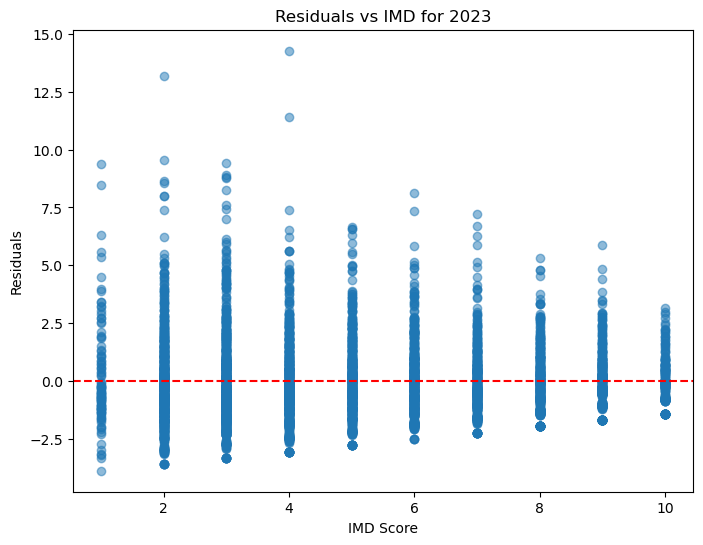

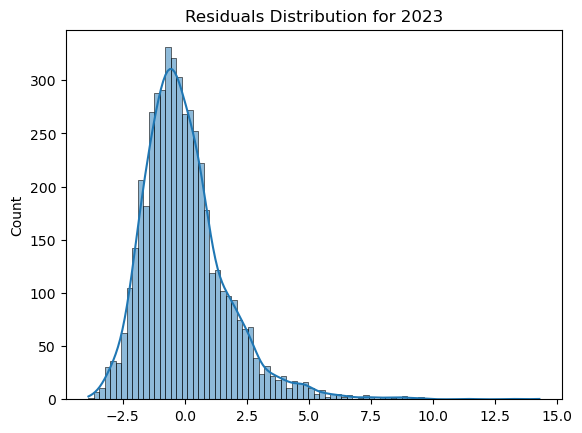

In [122]:
# 回归残差分析
residuals = model.resid

# 绘制残差图
plt.figure(figsize=(8, 6))
plt.scatter(lsoa_IDM['IMD'], residuals, alpha=0.5)
plt.axhline(0, color='red', linestyle='--')
plt.title(f'Residuals vs IMD for {year}')
plt.xlabel('IMD Score')
plt.ylabel('Residuals')
plt.show()

# 检查残差的正态性
import seaborn as sns
sns.histplot(residuals, kde=True)
plt.title(f'Residuals Distribution for {year}')
plt.show()


In [123]:
from statsmodels.robust.robust_linear_model import RLM

# 使用稳健回归（Huber方法）
robust_model = RLM(y, X).fit()

# 输出稳健回归结果
print(robust_model.summary())


                    Robust linear Model Regression Results                    
Dep. Variable:     casualty_rate_2023   No. Observations:                 4835
Model:                            RLM   Df Residuals:                     4833
Method:                          IRLS   Df Model:                            1
Norm:                          HuberT                                         
Scale Est.:                       mad                                         
Cov Type:                          H1                                         
Date:                Sun, 08 Dec 2024                                         
Time:                        15:28:08                                         
No. Iterations:                    24                                         
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
const          3.8596      0.049     78.413      0.0

In [124]:
from sklearn.model_selection import cross_val_score
from sklearn.linear_model import LinearRegression
from sklearn.preprocessing import StandardScaler
from sklearn.pipeline import make_pipeline

# 构建模型管道，包含标准化步骤
model = make_pipeline(StandardScaler(), LinearRegression())

# 进行交叉验证
scores = cross_val_score(model, lsoa_IDM[['IMD']], lsoa_IDM[f'casualty_rate_{year}'], cv=5, scoring='neg_mean_squared_error')

print(f'Cross-validated MSE: {scores.mean():.2f}')


Cross-validated MSE: -2.89


In [126]:
from sklearn.utils import resample

# 使用Bootstrap方法重抽样
n_iterations = 1000
bootstrapped_coefficients = []

for _ in range(n_iterations):
    # 随机抽样
    bootstrap_sample = resample(lsoa_IDM, n_samples=len(lsoa_IDM))
    X_bs = sm.add_constant(bootstrap_sample['IMD'])
    y_bs = bootstrap_sample[f'casualty_rate_{year}']
    
    # 拟合回归模型
    model_bs = sm.OLS(y_bs, X_bs).fit()
    
    # 记录回归系数
    bootstrapped_coefficients.append(model_bs.params['IMD'])

# 计算系数的置信区间
lower = np.percentile(bootstrapped_coefficients, 2.5)
upper = np.percentile(bootstrapped_coefficients, 97.5)

print(f'Bootstrap Confidence Interval for IMD coefficient: ({lower:.2f}, {upper:.2f})')


Bootstrap Confidence Interval for IMD coefficient: (-0.29, -0.26)


# collision_lsoa vs central_distance plot

In [94]:
from shapely.geometry import Point

lsoa_IDM_distance = lsoa_IDM.copy()
lsoa_IDM_distance = lsoa_IDM_distance.to_crs(crs='EPSG:27700')
lsoa_IDM_distance['centroid'] = lsoa_IDM_distance.geometry.centroid
lsoa_IDM_distance

# 1. 计算整个地图的中心点
# 计算所有 LSOA 的几何中心的平均坐标，即地图中心点
map_center = lsoa_IDM_distance.geometry.unary_union.centroid

# 2. 计算每个 LSOA 的几何中心到整个地图中心点的距离
lsoa_IDM_distance['distance_to_center'] = lsoa_IDM_distance['centroid'].distance(map_center)
lsoa_IDM_distance.head()

C:\Users\YU\AppData\Local\Temp\ipykernel_1824\3285844368.py:10: DeprecationWarning: The 'unary_union' attribute is deprecated, use the 'union_all()' method instead.
  map_center = lsoa_IDM_distance.geometry.unary_union.centroid


,lsoa,geometry,IMD,casualty_rate_2021,casualty_location_rate_2021,casualty_rate_2022,casualty_location_rate_2022,casualty_rate_2023,casualty_location_rate_2023,centroid,distance_to_center
0,E01000001,"POLYGON ((532105.094 182011.229, 532162.493 18...",9.0,0.000000,1.400818,0.000000,0.700409,0.677966,2.451432,POINT (532150.881 181615.037),2176.445039
1,E01000002,"POLYGON ((532746.815 181786.89, 532671.69 1815...",10.0,1.445087,0.932765,0.722543,1.865530,0.000000,0.466382,POINT (532443.356 181645.861),2343.559633
2,E01000003,"POLYGON ((532135.147 182198.118, 532158.252 18...",5.0,1.237624,0.931666,0.618812,0.000000,2.475248,0.000000,POINT (532207.064 182030.086),2578.458436
3,E01000005,"POLYGON ((533807.948 180767.769, 533649.065 18...",3.0,0.906618,4.195831,4.533092,2.429166,1.813237,3.533332,POINT (533618.593 181157.117),2837.282401
4,E01000006,"POLYGON ((545122.051 184314.93, 545271.919 184...",5.0,1.084011,0.000000,0.542005,0.369922,3.252033,0.369922,POINT (544934.369 184297.55),14485.582062


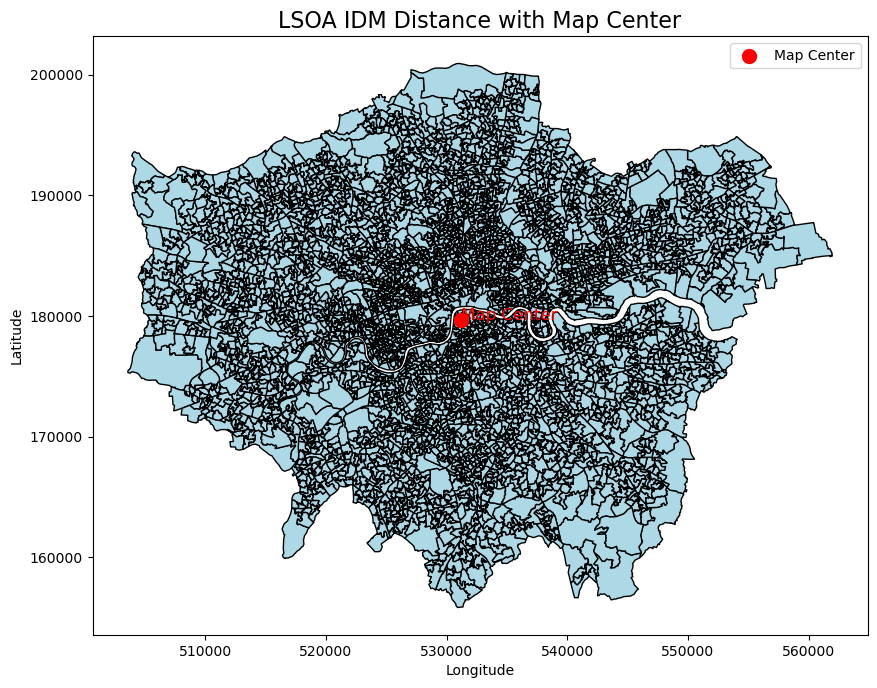

In [108]:
import geopandas as gpd
import matplotlib.pyplot as plt
from shapely.geometry import Point

# Assuming lsoa_IDM_distance is your GeoDataFrame and map_center is a tuple (longitude, latitude)

# Plot the GeoDataFrame
fig, ax = plt.subplots(figsize=(10, 10))
lsoa_IDM_distance.plot(ax=ax, color='lightblue', edgecolor='black')

# Plot the map center as a point (use a different color for visibility)
ax.scatter(map_center.x, map_center.y, color='red', s=100, label='Map Center')

# Optional: Add a label for the map center
ax.text(map_center.x + 0.01, map_center.y + 0.01, 'Map Center', fontsize=12, color='red')

# Set title and labels
ax.set_title('LSOA IDM Distance with Map Center', fontsize=16)
ax.set_xlabel('Longitude')
ax.set_ylabel('Latitude')

# Show the legend
ax.legend()

# Show the plot
plt.show()


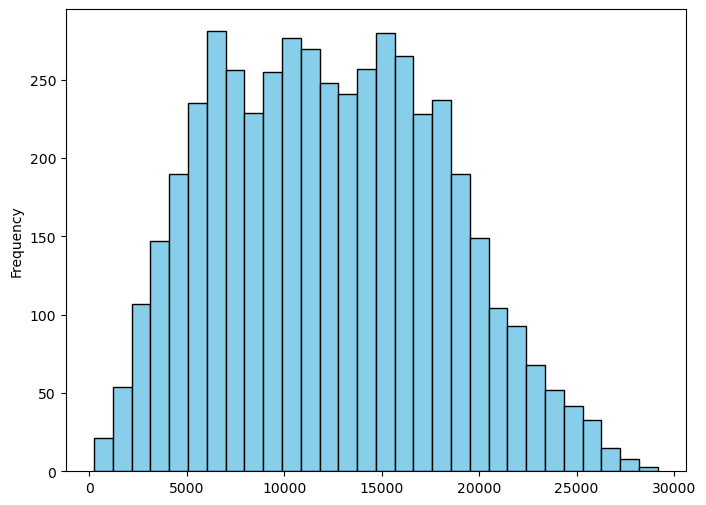

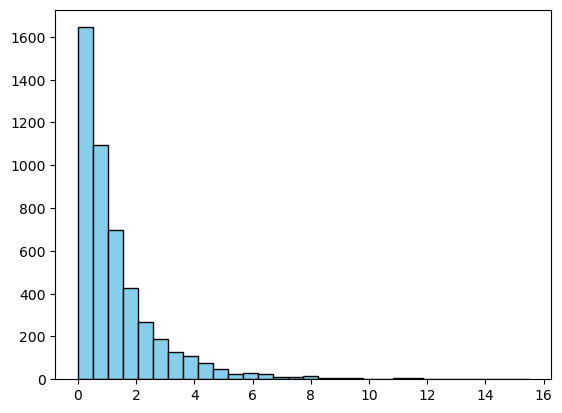

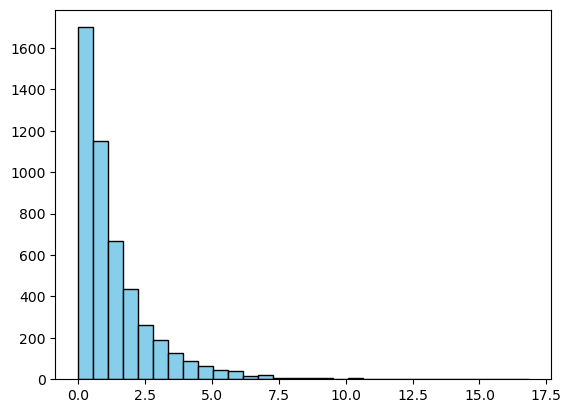

(array([1.967e+03, 1.158e+03, 6.460e+02, 3.630e+02, 2.200e+02, 1.580e+02,
        1.190e+02, 6.800e+01, 4.400e+01, 2.100e+01, 1.700e+01, 1.600e+01,
        9.000e+00, 6.000e+00, 1.000e+00, 9.000e+00, 5.000e+00, 1.000e+00,
        1.000e+00, 0.000e+00, 0.000e+00, 3.000e+00, 0.000e+00, 1.000e+00,
        0.000e+00, 0.000e+00, 0.000e+00, 1.000e+00, 0.000e+00, 1.000e+00]),
 array([ 0.        ,  0.64372498,  1.28744995,  1.93117493,  2.57489991,
         3.21862489,  3.86234986,  4.50607484,  5.14979982,  5.7935248 ,
         6.43724977,  7.08097475,  7.72469973,  8.36842471,  9.01214968,
         9.65587466, 10.29959964, 10.94332462, 11.58704959, 12.23077457,
        12.87449955, 13.51822453, 14.1619495 , 14.80567448, 15.44939946,
        16.09312443, 16.73684941, 17.38057439, 18.02429937, 18.66802434,
        19.31174932]),
 <BarContainer object of 30 artists>)

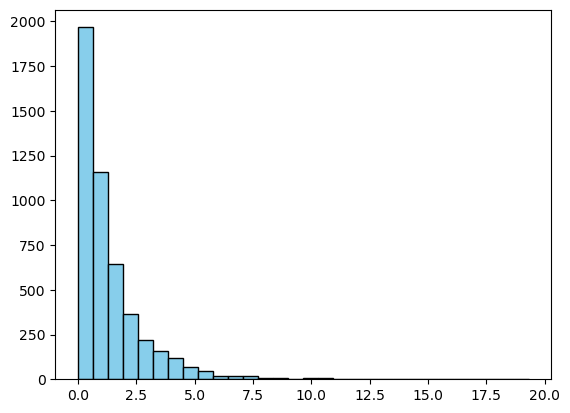

In [153]:
# 绘制 IMD 的直方图
plt.figure(figsize=(8, 6))
plt.hist(lsoa_IDM_distance['distance_to_center'], bins=30, color='skyblue', edgecolor='black')
plt.ylabel('Frequency')
plt.show()

plt.hist(lsoa_IDM_distance['casualty_location_rate_2021'], bins=30, color='skyblue', edgecolor='black')
plt.show()
plt.hist(lsoa_IDM_distance['casualty_location_rate_2022'], bins=30, color='skyblue', edgecolor='black')
plt.show()
plt.hist(lsoa_IDM_distance['casualty_location_rate_2023'], bins=30, color='skyblue', edgecolor='black')

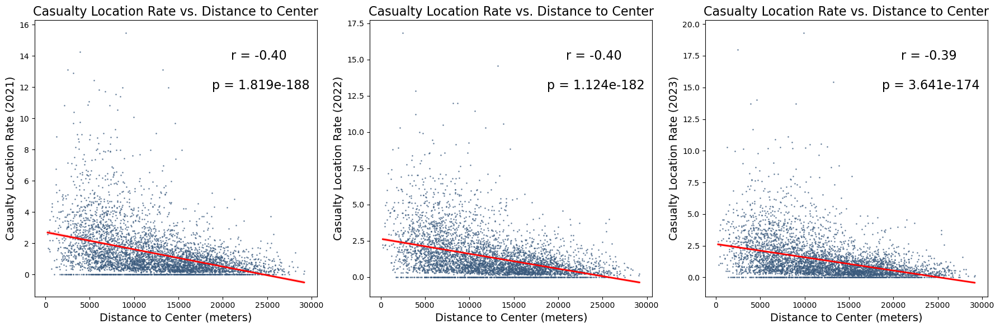

Year 2021: Pearson correlation coefficient (r) = -0.40, p-value = 1.819e-188
Year 2022: Pearson correlation coefficient (r) = -0.40, p-value = 1.124e-182
Year 2023: Pearson correlation coefficient (r) = -0.39, p-value = 3.641e-174


In [145]:
import matplotlib.pyplot as plt
import seaborn as sns
from scipy.stats import pearsonr

# 创建 1 行 3 列的子图
fig, axes = plt.subplots(1, 3, figsize=(18, 6))

# 定义年份和列名称
years = [2021, 2022, 2023]
cols = ['casualty_location_rate_2021', 'casualty_location_rate_2022', 'casualty_location_rate_2023']

# 字体大小设置
title_fontsize = 16
label_fontsize = 14

# 遍历每年的数据，绘制散点图和回归线
for i, (year, col) in enumerate(zip(years, cols)):
    # 计算皮尔逊相关系数和 p 值
    correlation, p_value = pearsonr(lsoa_IDM_distance['distance_to_center'], lsoa_IDM_distance[col])
    
    # 绘制散点图和回归线
    sns.regplot(
        data=lsoa_IDM_distance, 
        x='distance_to_center', 
        y=col, 
        ax=axes[i],
        scatter_kws={'s': 1, 'alpha': 0.6, 'color': '#3A5A7D'}, 
        line_kws={'color': 'red', 'lw': 2}
    )
    
    # 设置标题
    axes[i].set_title(
        f'Casualty Location Rate vs. Distance to Center', 
        fontsize=title_fontsize
    )
    axes[i].set_xlabel('Distance to Center (meters)', fontsize=label_fontsize)
    axes[i].set_ylabel(f'Casualty Location Rate ({year})', fontsize=label_fontsize)
    
    # 在图中添加相关系数和 p 值
    axes[i].text(
        0.8, 0.75,  # 图中相对位置
        f'r = {correlation:.2f} \n\np = {p_value:.3e}',  # 显示 r 和 p 值
        fontsize=16, 
        ha='center', 
        transform=axes[i].transAxes
    )

# 调整布局
plt.tight_layout()

# 显示图形
plt.show()

# 打印每年的皮尔逊相关系数
for year, col in zip(years, cols):
    correlation, p_value = pearsonr(lsoa_IDM_distance['distance_to_center'], lsoa_IDM_distance[col])
    print(f'Year {year}: Pearson correlation coefficient (r) = {correlation:.2f}, p-value = {p_value:.3e}')


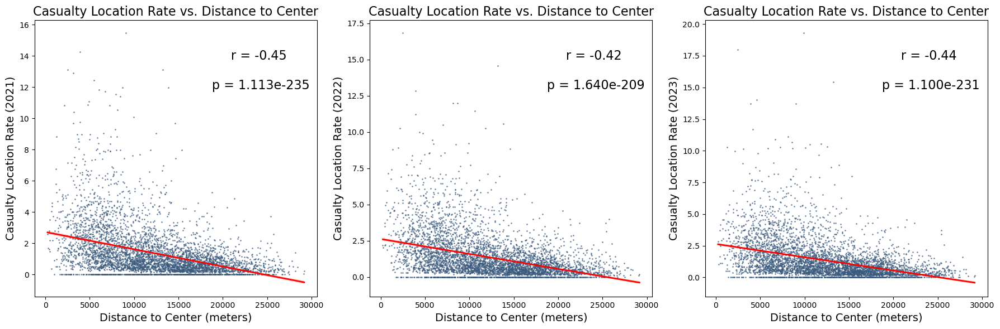

Year 2021: Spearman correlation coefficient (r) = -0.45, p-value = 1.113e-235
Year 2022: Spearman correlation coefficient (r) = -0.42, p-value = 1.640e-209
Year 2023: Spearman correlation coefficient (r) = -0.44, p-value = 1.100e-231


In [166]:
import matplotlib.pyplot as plt
import seaborn as sns
from scipy.stats import spearmanr  # 导入斯皮尔曼等级相关系数

# 创建 1 行 3 列的子图
fig, axes = plt.subplots(1, 3, figsize=(18, 6))

# 定义年份和列名称
years = [2021, 2022, 2023]
cols = ['casualty_location_rate_2021', 'casualty_location_rate_2022', 'casualty_location_rate_2023']

# 字体大小设置
title_fontsize = 16
label_fontsize = 14

# 遍历每年的数据，绘制散点图和回归线
for i, (year, col) in enumerate(zip(years, cols)):
    # 计算斯皮尔曼等级相关系数和 p 值
    correlation, p_value = spearmanr(lsoa_IDM_distance['distance_to_center'], lsoa_IDM_distance[col])
    
    # 绘制散点图和回归线
    sns.regplot(
        data=lsoa_IDM_distance, 
        x='distance_to_center', 
        y=col, 
        ax=axes[i],
        scatter_kws={'s': 1, 'alpha': 0.6, 'color': '#3A5A7D'}, 
        line_kws={'color': 'red', 'lw': 2}
    )
    
    # 设置标题
    axes[i].set_title(
        f'Casualty Location Rate vs. Distance to Center', 
        fontsize=title_fontsize
    )
    axes[i].set_xlabel('Distance to Center (meters)', fontsize=label_fontsize)
    axes[i].set_ylabel(f'Casualty Location Rate ({year})', fontsize=label_fontsize)
    
    
    # 在图中添加相关系数和 p 值
    axes[i].text(
        0.8, 0.75,  # 图中相对位置
        f'r = {correlation:.2f} \n\np = {p_value:.3e}',  # 显示 r 和 p 值
        fontsize=16, 
        ha='center', 
        transform=axes[i].transAxes
    )

# 调整布局
plt.tight_layout()

# 显示图形
plt.show()

# 打印每年的斯皮尔曼相关系数
for year, col in zip(years, cols):
    correlation, p_value = spearmanr(lsoa_IDM_distance['distance_to_center'], lsoa_IDM_distance[col])
    print(f'Year {year}: Spearman correlation coefficient (r) = {correlation:.2f}, p-value = {p_value:.3e}')
